In [1]:
'''using 5 machine learning models
steps of machine learning models :-
0-Read data
1-Exploring Data analysis =>EDA
2-Data preprocessing
3-Initate ML model
4-Fit data
5-Prediction
6-Evaluation
'''
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk


from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix 
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics 
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV


In [4]:
#0) Read data 
df=pd.read_csv('E:\\ECU-Materials\\Sensor-1\\semester two\\Data Mining\\DataSet\\MIT-BIH Arrhythmia Database.csv')

#print dataset
df

,record,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,101,N,76,313.0,0.074347,-0.160548,1.036401,-0.285662,-0.026824,41,...,0.025930,2,18,22,2,0.025930,0.025930,0.025930,0.025436,0.025436
1,101,N,313,315.0,-0.052079,-0.264784,0.886597,-0.366298,-0.059710,21,...,-0.042009,26,27,62,9,-0.042009,-0.029498,0.005012,0.030892,0.002986
2,101,N,315,321.0,-0.062151,-0.296983,0.991859,-0.410306,-0.065686,22,...,0.009528,3,8,12,1,0.009528,0.009528,0.008786,0.008786,0.008368
3,101,N,321,336.0,-0.063322,-0.281386,1.034903,-0.403880,-0.071750,22,...,-0.020536,6,9,16,1,-0.020536,-0.020257,-0.018965,-0.016968,-0.014555
4,101,N,336,344.0,-0.062915,1.046914,1.046408,1.046408,-0.074639,11,...,0.016053,16,5,31,10,0.016053,0.006742,0.002782,-0.007798,-0.051155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100684,234,N,240,241.0,-0.110230,1.420339,1.403346,1.403346,-0.115682,14,...,-0.069234,5,6,20,9,-0.069234,-0.068378,-0.065373,-0.060779,-0.054383
100685,234,N,241,243.0,-0.119014,1.424782,1.420328,1.420328,-0.134406,13,...,-0.069530,7,5,20,8,-0.069530,-0.069290,-0.066317,-0.053437,-0.045120
100686,234,N,243,252.0,0.173524,-0.443214,1.436878,-0.714642,-0.136431,38,...,-0.089396,9,7,24,8,-0.089396,-0.088155,-0.078611,-0.066763,-0.058650
100687,234,N,252,244.0,-0.119820,-0.401522,1.337051,-0.688560,-0.125076,27,...,-0.065487,3,1,12,8,-0.065487,-0.065487,-0.064941,-0.064941,-0.061120


In [5]:
#0.1)
df.head()   #by default print the first 5 rows


,record,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,101,N,76,313.0,0.074347,-0.160548,1.036401,-0.285662,-0.026824,41,...,0.025930,2,18,22,2,0.025930,0.025930,0.025930,0.025436,0.025436
1,101,N,313,315.0,-0.052079,-0.264784,0.886597,-0.366298,-0.059710,21,...,-0.042009,26,27,62,9,-0.042009,-0.029498,0.005012,0.030892,0.002986
2,101,N,315,321.0,-0.062151,-0.296983,0.991859,-0.410306,-0.065686,22,...,0.009528,3,8,12,1,0.009528,0.009528,0.008786,0.008786,0.008368
3,101,N,321,336.0,-0.063322,-0.281386,1.034903,-0.403880,-0.071750,22,...,-0.020536,6,9,16,1,-0.020536,-0.020257,-0.018965,-0.016968,-0.014555
4,101,N,336,344.0,-0.062915,1.046914,1.046408,1.046408,-0.074639,11,...,0.016053,16,5,31,10,0.016053,0.006742,0.002782,-0.007798,-0.051155


In [6]:
#0.2)
print("Columns Labels : ")
print(df.columns)   #names of columns

Columns Labels : 
Index(['record', 'type', '0_pre-RR', '0_post-RR', '0_pPeak', '0_tPeak',
       '0_rPeak', '0_sPeak', '0_qPeak', '0_qrs_interval', '0_pq_interval',
       '0_qt_interval', '0_st_interval', '0_qrs_morph0', '0_qrs_morph1',
       '0_qrs_morph2', '0_qrs_morph3', '0_qrs_morph4', '1_pre-RR', '1_post-RR',
       '1_pPeak', '1_tPeak', '1_rPeak', '1_sPeak', '1_qPeak', '1_qrs_interval',
       '1_pq_interval', '1_qt_interval', '1_st_interval', '1_qrs_morph0',
       '1_qrs_morph1', '1_qrs_morph2', '1_qrs_morph3', '1_qrs_morph4'],
      dtype='object')


In [7]:
##0.3)summary statistics for object Data    #object may be categorical or string

#Hint: loop checks all columns
#all_descriptions = []
# for col in df.columns:
#     if col != "type" and df[col].dtype != "object":
#         desc = df.groupby("type")[col].describe()
#         desc["attribute"] = col
#         desc = desc.reset_index()
#         all_descriptions.append(desc)

# final_descriptions_df = pd.concat(all_descriptions, ignore_index=True)
# final_descriptions_df 

des_0_pre_RR = df.groupby("type")["0_pre-RR"].describe()
print("des_0_pre_RR:\n", des_0_pre_RR, "\n")


des_0_pre_RR:
         count        mean         std   min    25%    50%    75%     max
type                                                                    
F       803.0  208.602740   34.372288  37.0  197.0  203.0  213.0   652.0
N     90083.0  289.308416   78.821497  11.0  240.0  275.0  331.0  2114.0
Q        15.0  203.733333  133.523388  24.0   66.0  228.0  280.0   475.0
SVEB   2779.0  219.399424   53.122123  37.0  174.0  242.0  264.0   396.0
VEB    7009.0  184.128549   53.890571  20.0  156.0  181.0  199.0   903.0 



In [8]:
des_0_post_RR = df.groupby("type")["0_post-RR"].describe()
print("des_0_post_RR:\n", des_0_post_RR, "\n")

des_0_post_RR:
         count        mean         std   min    25%    50%    75%     max
type                                                                    
F       803.0  190.125778   39.442314  68.0  165.0  195.0  203.5   509.0
N     90083.0  276.162772   72.533837   6.0  231.0  265.0  320.0  1497.0
Q        15.0  264.133333   98.451487  35.0  226.5  248.0  300.5   490.0
SVEB   2779.0  310.015113  186.395420  45.0  240.0  266.0  326.0  2114.0
VEB    7009.0  307.466400  103.734013  26.0  239.0  294.0  375.0   903.0 



In [9]:
des_0_pPeak = df.groupby("type")["0_pPeak"].describe()
print("des_0_pPeak:\n", des_0_pPeak, "\n")

des_0_pPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -0.000152  0.185535 -0.375340 -0.180328  0.042677  0.133844   
N     90083.0  0.035449  0.140553 -3.094391 -0.059035  0.008119  0.111954   
Q        15.0  0.561390  0.997332 -0.243263 -0.015571  0.205968  0.654950   
SVEB   2779.0  0.050931  0.114878 -0.421942  0.011025  0.047979  0.070308   
VEB    7009.0  0.238021  0.324510 -0.967302  0.038387  0.173806  0.353765   

           max  
type            
F     1.230617  
N     3.821118  
Q     3.406981  
SVEB  0.985749  
VEB   2.176312   



In [10]:
des_0_tPeak = df.groupby("type")["0_tPeak"].describe()
print("des_0_tPeak:\n", des_0_tPeak, "\n")

des_0_tPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  0.426667  0.928807 -1.582135 -0.577833  0.586313  1.160507   
N     90083.0  0.357683  0.752508 -1.484831 -0.267993  0.214455  0.919678   
Q        15.0  0.471211  0.832627 -0.841308 -0.102038  0.439663  1.325119   
SVEB   2779.0  0.488695  0.468600 -0.894829  0.128806  0.528907  0.698421   
VEB    7009.0  0.507037  0.610269 -2.006422  0.105985  0.557820  1.009895   

           max  
type            
F     2.128751  
N     4.118327  
Q     1.833336  
SVEB  2.264349  
VEB   2.560806   



In [11]:
des_0_rPeak = df.groupby("type")["0_rPeak"].describe()
print("des_0_rPeak:\n", des_0_rPeak, "\n")

des_0_rPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  1.647521  0.598384 -1.453325  1.268530  1.649105  2.117415   
N     90083.0  1.103145  0.543423 -2.321045  0.796631  1.140175  1.433607   
Q        15.0  0.879073  0.936796 -0.491010  0.159045  0.842106  1.314064   
SVEB   2779.0  0.691429  0.433245 -0.664364  0.498810  0.619221  0.930982   
VEB    7009.0  0.505460  1.068165 -2.372835 -0.539579  0.844475  1.228085   

           max  
type            
F     2.718970  
N     4.018918  
Q     3.080710  
SVEB  2.752367  
VEB   2.520848   



In [12]:
des_0_sPeak = df.groupby("type")["0_sPeak"].describe()
print("des_0_sPeak:\n", des_0_sPeak, "\n")

des_0_sPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -0.556404  1.257355 -2.663361 -1.379301 -1.148551  1.078159   
N     90083.0 -0.068285  1.002669 -3.622550 -0.749607 -0.495805  0.891407   
Q        15.0 -0.727784  0.613446 -1.631210 -1.318865 -0.842962 -0.259752   
SVEB   2779.0  0.244229  0.716044 -1.863295 -0.431550  0.491495  0.667537   
VEB    7009.0 -1.084290  0.909354 -3.111706 -1.758037 -1.264825 -0.614453   

           max  
type            
F     2.123365  
N     4.018918  
Q     0.223959  
SVEB  2.228378  
VEB   1.990037   



In [13]:
des_0_qPeak = df.groupby("type")["0_qPeak"].describe()
print("des_0_qPeak:\n", des_0_qPeak, "\n")

des_0_qPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -0.136713  0.175993 -1.453325 -0.245708 -0.085208 -0.023908   
N     90083.0 -0.075928  0.120036 -3.871359 -0.126272 -0.069594 -0.018530   
Q        15.0 -0.020443  1.067802 -1.952061 -0.395655 -0.026488  0.045123   
SVEB   2779.0 -0.030453  0.147538 -0.763316 -0.067426  0.019757  0.042668   
VEB    7009.0 -0.295954  0.518942 -2.372835 -0.601466 -0.189789  0.022110   

           max  
type            
F     1.228729  
N     2.129282  
Q     3.080710  
SVEB  0.498941  
VEB   2.163584   



In [14]:
des_0_qrs_interval = df.groupby("type")["0_qrs_interval"].describe()
print("des_0_qrs_interval:\n", des_0_qrs_interval, "\n")

des_0_qrs_interval:
         count       mean        std  min   25%   50%   75%    max
type                                                             
F       803.0  33.566625  10.639595  3.0  27.0  32.0  44.0   59.0
N     90083.0  27.808377  13.318390  0.0  19.0  27.0  37.0  170.0
Q        15.0  39.266667  30.529767  5.0  15.5  40.0  55.0  119.0
SVEB   2779.0  22.931990  14.208999  1.0  14.0  20.0  28.0  117.0
VEB    7009.0  36.505921  28.008458  0.0   5.0  34.0  57.0  149.0 



In [15]:
des_0_pq_interval = df.groupby("type")["0_pq_interval"].describe()
print("des_0_pq_interval:\n", des_0_pq_interval, "\n")

des_0_pq_interval:
         count       mean        std  min  25%   50%   75%    max
type                                                            
F       803.0  11.211706   7.347282  1.0  5.0  13.0  16.0   95.0
N     90083.0  10.504779   8.615410  1.0  4.0   7.0  16.0  122.0
Q        15.0  16.933333  25.571934  2.0  5.0   7.0  13.5   89.0
SVEB   2779.0   8.828715   8.428466  1.0  4.0   6.0   8.0   60.0
VEB    7009.0  17.798259  15.720785  1.0  7.0  10.0  29.0  150.0 



In [16]:
des_0_qt_interval = df.groupby("type")["0_qt_interval"].describe()
print("des_0_qt_interval:\n", des_0_qt_interval, "\n")

des_0_qt_interval:
         count       mean        std   min   25%   50%    75%    max
type                                                               
F       803.0  75.870486  40.740321   9.0  44.0  54.0  117.0  169.0
N     90083.0  57.595817  38.263715   5.0  33.0  45.0   72.0  328.0
Q        15.0  86.533333  67.616425  15.0  30.5  69.0  125.0  211.0
SVEB   2779.0  40.258006  28.425898  11.0  21.0  30.0   51.0  223.0
VEB    7009.0  93.635611  52.006373  11.0  49.0  80.0  133.0  334.0 



In [17]:
des_0_st_interval = df.groupby("type")["0_st_interval"].describe()
print("des_0_st_interval:\n", des_0_st_interval, "\n")

des_0_st_interval:
         count       mean        std  min   25%   50%   75%    max
type                                                             
F       803.0  31.092154  34.103356  1.0   4.0   9.0  75.0  104.0
N     90083.0  19.282662  29.297233  1.0   1.0   8.0  14.0  141.0
Q        15.0  30.333333  35.525980  2.0   6.0  12.0  59.5  117.0
SVEB   2779.0   8.497301  16.709011  1.0   1.0   1.0   8.0  125.0
VEB    7009.0  39.331431  30.385318  1.0  13.0  34.0  61.0  125.0 



In [18]:
des_0_qrs_morph0 = df.groupby("type")["0_qrs_morph0"].describe()
print("des_0_qrs_morph0:\n", des_0_qrs_morph0, "\n")

des_0_qrs_morph0:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -0.136713  0.175993 -1.453325 -0.245708 -0.085208 -0.023908   
N     90083.0 -0.075928  0.120036 -3.871359 -0.126272 -0.069594 -0.018530   
Q        15.0 -0.020443  1.067802 -1.952061 -0.395655 -0.026488  0.045123   
SVEB   2779.0 -0.030453  0.147538 -0.763316 -0.067426  0.019757  0.042668   
VEB    7009.0 -0.295954  0.518942 -2.372835 -0.601466 -0.189789  0.022110   

           max  
type            
F     1.228729  
N     2.129282  
Q     3.080710  
SVEB  0.498941  
VEB   2.163584   



In [19]:
des_0_qrs_morph1 = df.groupby("type")["0_qrs_morph1"].describe()
print("des_0_qrs_morph1:\n", des_0_qrs_morph1, "\n")

des_0_qrs_morph1:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  0.056130  0.214551 -1.722791 -0.020128  0.060310  0.164344   
N     90083.0  0.026439  0.190674 -2.321045 -0.070722 -0.002261  0.097091   
Q        15.0  0.225442  0.937947 -1.274559 -0.142969  0.153313  0.512749   
SVEB   2779.0  0.005643  0.177684 -0.768497 -0.029002  0.039300  0.061915   
VEB    7009.0 -0.248656  0.647320 -2.629032 -0.668336 -0.086512  0.213235   

           max  
type            
F     1.238072  
N     2.109813  
Q     2.869694  
SVEB  0.781626  
VEB   1.839905   



In [20]:
des_0_qrs_morph2 = df.groupby("type")["0_qrs_morph2"].describe()
print("des_0_qrs_morph2:\n", des_0_qrs_morph2, "\n")

des_0_qrs_morph2:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  0.725401  0.702247 -1.931899  0.133985  0.594417  1.400797   
N     90083.0  0.338229  0.495630 -2.407612  0.002302  0.123424  0.632311   
Q        15.0  0.415091  0.966195 -1.054227 -0.381956  0.203023  1.111589   
SVEB   2779.0  0.119749  0.318367 -0.868948  0.030860  0.074172  0.133194   
VEB    7009.0 -0.057187  0.954510 -2.840410 -0.762764  0.049601  0.528158   

           max  
type            
F     2.281207  
N     3.331326  
Q     2.210045  
SVEB  1.769741  
VEB   2.309413   



In [21]:
des_0_qrs_morph3 = df.groupby("type")["0_qrs_morph3"].describe()
print("des_0_qrs_morph3:\n", des_0_qrs_morph3, "\n")

des_0_qrs_morph3:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  1.166573  0.791959 -2.072106  0.540008  1.100814  1.933397   
N     90083.0  0.589973  0.557065 -2.470184  0.179680  0.511542  0.951876   
Q        15.0  0.291197  0.891706 -1.304799 -0.280148  0.310804  1.085297   
SVEB   2779.0  0.243174  0.386505 -0.953109  0.078130  0.157896  0.394088   
VEB    7009.0  0.105266  1.119902 -2.995204 -0.844735  0.400072  0.901410   

           max  
type            
F     2.578144  
N     3.224798  
Q     1.435719  
SVEB  2.217564  
VEB   2.225070   



In [22]:
des_0_qrs_morph4 = df.groupby("type")["0_qrs_morph4"].describe()
print("des_0_qrs_morph4:\n", des_0_qrs_morph4, "\n")

des_0_qrs_morph4:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  0.546656  0.565692 -2.141906  0.131467  0.597730  0.907356   
N     90083.0  0.327522  0.519274 -2.505479  0.001016  0.285196  0.631965   
Q        15.0 -0.261702  0.656886 -1.500049 -0.564095 -0.088051  0.014438   
SVEB   2779.0  0.253399  0.374119 -1.009224  0.123155  0.264638  0.394996   
VEB    7009.0 -0.234803  0.991382 -3.086096 -0.995956 -0.029948  0.505086   

           max  
type            
F     1.966445  
N     2.632724  
Q     1.066469  
SVEB  1.818357  
VEB   2.444145   



In [23]:
des_1_pre_RR = df.groupby("type")["1_pre-RR"].describe()
print("des_1_pre_RR:\n", des_1_pre_RR, "\n")

des_1_pre_RR:
         count        mean         std   min    25%    50%    75%     max
type                                                                    
F       803.0  208.602740   34.372288  37.0  197.0  203.0  213.0   652.0
N     90083.0  289.308416   78.821497  11.0  240.0  275.0  331.0  2114.0
Q        15.0  203.733333  133.523388  24.0   66.0  228.0  280.0   475.0
SVEB   2779.0  219.399424   53.122123  37.0  174.0  242.0  264.0   396.0
VEB    7009.0  184.128549   53.890571  20.0  156.0  181.0  199.0   903.0 



In [24]:
des_1_post_RR = df.groupby("type")["1_post-RR"].describe()
print("des_1_post_RR:\n", des_1_post_RR, "\n")

des_1_post_RR:
         count        mean         std   min    25%    50%    75%     max
type                                                                    
F       803.0  190.125778   39.442314  68.0  165.0  195.0  203.5   509.0
N     90083.0  276.162772   72.533837   6.0  231.0  265.0  320.0  1497.0
Q        15.0  264.133333   98.451487  35.0  226.5  248.0  300.5   490.0
SVEB   2779.0  310.015113  186.395420  45.0  240.0  266.0  326.0  2114.0
VEB    7009.0  307.466400  103.734013  26.0  239.0  294.0  375.0   903.0 



In [25]:
des_1_pPeak = df.groupby("type")["1_pPeak"].describe()
print("des_1_pPeak:\n", des_1_pPeak, "\n")

des_1_pPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  0.104168  0.157346 -0.793710 -0.002377  0.030179  0.227011   
N     90083.0  0.028729  0.121563 -2.108257 -0.015251  0.014604  0.058123   
Q        15.0  0.138419  0.224315 -0.242020  0.016785  0.093861  0.315203   
SVEB   2779.0  0.014135  0.116210 -0.919893 -0.007913  0.008012  0.026850   
VEB    7009.0  0.048504  0.244212 -1.357336 -0.041107  0.016285  0.092176   

           max  
type            
F     0.514502  
N     5.161310  
Q     0.566701  
SVEB  4.034142  
VEB   4.774181   



In [26]:
des_1_tPeak = df.groupby("type")["1_tPeak"].describe()
print("des_1_tPeak:\n", des_1_tPeak, "\n")

des_1_tPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0  0.848341  0.529535 -0.967083  0.517771  0.755621  1.125053   
N     90083.0  0.341282  0.363101 -2.493494  0.099627  0.264492  0.588559   
Q        15.0  0.373493  0.322527  0.021683  0.132332  0.305345  0.574597   
SVEB   2779.0  0.329142  0.249712 -1.039583  0.206821  0.339047  0.413505   
VEB    7009.0  0.589183  0.496640 -1.702058  0.289248  0.552473  0.790876   

           max  
type            
F     2.238387  
N     7.002694  
Q     1.076890  
SVEB  2.379348  
VEB   2.958263   



In [27]:
des_1_rPeak = df.groupby("type")["1_rPeak"].describe()
print("des_1_rPeak:\n", des_1_rPeak, "\n")

des_1_rPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.279614  0.923121 -3.008446 -2.182090 -0.866294 -0.628074   
N     90083.0 -0.109539  0.589665 -3.847312 -0.379122 -0.078442  0.106278   
Q        15.0 -0.258442  0.306521 -0.815364 -0.499699 -0.190205 -0.059090   
SVEB   2779.0 -0.088281  0.339559 -2.021925 -0.103693  0.002712  0.035696   
VEB    7009.0 -0.212149  0.611872 -3.094737 -0.637659 -0.232500  0.174363   

           max  
type            
F     1.889282  
N     4.033554  
Q     0.201296  
SVEB  3.057928  
VEB   3.839972   



In [28]:
des_1_sPeak = df.groupby("type")["1_sPeak"].describe()
print("des_1_sPeak:\n", des_1_sPeak, "\n")

des_1_sPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.505412  0.982088 -3.065915 -2.578512 -0.938058 -0.753160   
N     90083.0 -0.471911  0.573161 -6.154873 -0.788099 -0.360060 -0.157411   
Q        15.0 -0.500821  0.247323 -0.996073 -0.603752 -0.551056 -0.338579   
SVEB   2779.0 -0.421011  0.303543 -4.701907 -0.467809 -0.362978 -0.294914   
VEB    7009.0 -0.552272  0.665335 -4.302888 -0.869773 -0.582333 -0.110858   

           max  
type            
F     1.889282  
N     3.317595  
Q    -0.053824  
SVEB  1.395516  
VEB   2.414291   



In [29]:
des_1_qPeak = df.groupby("type")["1_qPeak"].describe()
print("des_1_qPeak:\n", des_1_qPeak, "\n")

des_1_qPeak:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.401350  0.979746 -3.037850 -2.584035 -0.877768 -0.672626   
N     90083.0 -0.304947  0.420802 -5.481982 -0.484782 -0.105255 -0.027623   
Q        15.0 -0.408503  0.423044 -1.548658 -0.632850 -0.278201 -0.133991   
SVEB   2779.0 -0.157125  0.298159 -4.248657 -0.156070 -0.027240 -0.009154   
VEB    7009.0 -0.473497  0.532840 -3.714946 -0.702634 -0.388070 -0.103331   

           max  
type            
F     0.201406  
N     4.033554  
Q     0.143144  
SVEB  0.785993  
VEB   3.398384   



In [30]:
des_1_qrs_interval = df.groupby("type")["1_qrs_interval"].describe()
print("des_1_qrs_interval:\n", des_1_qrs_interval, "\n")

des_1_qrs_interval:
         count       mean        std  min  25%   50%   75%    max
type                                                            
F       803.0   4.861768   7.717879  0.0  2.0   4.0   6.0  157.0
N     90083.0  10.984836  11.592990  0.0  3.0   6.0  18.0  260.0
Q        15.0   9.133333   6.895823  1.0  4.5   8.0  10.0   26.0
SVEB   2779.0  13.241094   9.136917  0.0  5.0  14.0  20.0   93.0
VEB    7009.0  14.064060  17.354706  0.0  4.0   7.0  19.0  161.0 



In [31]:
des_1_pq_interval = df.groupby("type")["1_pq_interval"].describe()
print("des_1_pq_interval:\n", des_1_pq_interval, "\n")

des_1_pq_interval:
         count       mean        std  min  25%   50%   75%    max
type                                                            
F       803.0  14.242839   6.488398  1.0  9.0  14.0  19.0   84.0
N     90083.0   9.826160   7.229262  1.0  5.0   8.0  13.0  185.0
Q        15.0  12.333333   7.650086  1.0  7.0  10.0  18.0   27.0
SVEB   2779.0   8.770421   7.717742  1.0  4.0   7.0  10.0  123.0
VEB    7009.0  19.229134  18.093405  1.0  9.0  15.0  22.0  175.0 



In [32]:
des_1_qt_interval = df.groupby("type")["1_qt_interval"].describe()
print("des_1_qt_interval:\n", des_1_qt_interval, "\n")

des_1_qt_interval:
         count       mean        std   min   25%   50%   75%    max
type                                                              
F       803.0  35.961395  10.434919  11.0  28.0  35.0  42.0  161.0
N     90083.0  34.735100  14.950211   5.0  24.0  31.0  43.0  412.0
Q        15.0  48.133333  28.891093  20.0  30.5  39.0  52.5  133.0
SVEB   2779.0  34.451241  14.634325   5.0  24.0  34.0  40.0  342.0
VEB    7009.0  54.471822  32.013492   6.0  38.0  47.0  59.0  400.0 



In [33]:
des_1_st_interval = df.groupby("type")["1_st_interval"].describe()
print("des_1_st_interval:\n", des_1_st_interval, "\n")

des_1_st_interval:
         count       mean        std  min   25%   50%   75%    max
type                                                             
F       803.0  16.856787   4.372398  1.0  14.0  17.0  19.0   34.0
N     90083.0  13.924103   8.370766  1.0   9.0  12.0  17.0  206.0
Q        15.0  26.666667  24.274227  2.0  13.5  17.0  31.0   99.0
SVEB   2779.0  12.439727   5.745962  1.0  11.0  11.0  12.0  159.0
VEB    7009.0  21.178627  15.039163  1.0  12.0  19.0  31.0  215.0 



In [34]:
des_1_qrs_morph0 = df.groupby("type")["1_qrs_morph0"].describe()
print("des_1_qrs_morph0:\n", des_1_qrs_morph0, "\n")

des_1_qrs_morph0:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.401350  0.979746 -3.037850 -2.584035 -0.877768 -0.672626   
N     90083.0 -0.304947  0.420802 -5.481982 -0.484782 -0.105255 -0.027623   
Q        15.0 -0.408503  0.423044 -1.548658 -0.632850 -0.278201 -0.133991   
SVEB   2779.0 -0.157125  0.298159 -4.248657 -0.156070 -0.027240 -0.009154   
VEB    7009.0 -0.473497  0.532840 -3.714946 -0.702634 -0.388070 -0.103331   

           max  
type            
F     0.201406  
N     4.033554  
Q     0.143144  
SVEB  0.785993  
VEB   3.398384   



In [35]:
des_1_qrs_morph1 = df.groupby("type")["1_qrs_morph1"].describe()
print("des_1_qrs_morph1:\n", des_1_qrs_morph1, "\n")

des_1_qrs_morph1:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.429395  0.968604 -3.017590 -2.560488 -0.885425 -0.690757   
N     90083.0 -0.303010  0.430367 -4.493784 -0.506666 -0.107637 -0.015374   
Q        15.0 -0.404672  0.409598 -1.448839 -0.657789 -0.226999 -0.136099   
SVEB   2779.0 -0.149715  0.296513 -2.388126 -0.152520 -0.028718  0.000262   
VEB    7009.0 -0.447518  0.551531 -3.511014 -0.693424 -0.383133 -0.086003   

           max  
type            
F     0.475487  
N     3.585718  
Q     0.189707  
SVEB  0.790034  
VEB   3.148790   



In [36]:

des_1_qrs_morph2 = df.groupby("type")["1_qrs_morph2"].describe()
print("des_1_qrs_morph2:\n", des_1_qrs_morph2, "\n")


des_1_qrs_morph2:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.478200  0.972411 -3.008446 -2.560619 -0.905398 -0.716512   
N     90083.0 -0.294510  0.496227 -4.398122 -0.587811 -0.146026  0.018295   
Q        15.0 -0.424247  0.383378 -1.185659 -0.706523 -0.367212 -0.196872   
SVEB   2779.0 -0.151566  0.340895 -2.856452 -0.199042 -0.020760  0.024132   
VEB    7009.0 -0.420702  0.595264 -3.286466 -0.707262 -0.395193 -0.033451   

           max  
type            
F     0.683343  
N     2.691557  
Q     0.188569  
SVEB  1.270265  
VEB   2.379443   



In [37]:
des_1_qrs_morph3 = df.groupby("type")["1_qrs_morph3"].describe()
print("des_1_qrs_morph3:\n", des_1_qrs_morph3, "\n")


des_1_qrs_morph3:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.501887  0.972914 -3.008446 -2.553363 -0.913783 -0.727077   
N     90083.0 -0.276876  0.581861 -4.069726 -0.604497 -0.189616  0.051940   
Q        15.0 -0.447666  0.310353 -0.834823 -0.697742 -0.487378 -0.263293   
SVEB   2779.0 -0.189838  0.360470 -3.882442 -0.279992 -0.062732  0.005428   
VEB    7009.0 -0.429877  0.594893 -3.286466 -0.746224 -0.391467  0.021219   

           max  
type            
F     0.450228  
N     3.755566  
Q     0.123946  
SVEB  2.423018  
VEB   1.918777   



In [38]:
des_1_qrs_morph4 = df.groupby("type")["1_qrs_morph4"].describe()
print("des_1_qrs_morph4:\n", des_1_qrs_morph4, "\n")

des_1_qrs_morph4:
         count      mean       std       min       25%       50%       75%  \
type                                                                        
F       803.0 -1.513908  0.982316 -3.016091 -2.561172 -0.918592 -0.741466   
N     90083.0 -0.349019  0.573949 -3.991484 -0.655522 -0.248916 -0.047660   
Q        15.0 -0.489034  0.242056 -0.945575 -0.611411 -0.529616 -0.298853   
SVEB   2779.0 -0.311011  0.326513 -4.520327 -0.365405 -0.234927 -0.139330   
VEB    7009.0 -0.485745  0.598362 -3.206732 -0.789300 -0.461338 -0.084246   

           max  
type            
F     0.918775  
N     2.869186  
Q    -0.133161  
SVEB  1.202811  
VEB   1.918604   



In [39]:
#0.4)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100689 entries, 0 to 100688
Data columns (total 34 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   record          100689 non-null  int64  
 1   type            100689 non-null  object 
 2   0_pre-RR        100689 non-null  int64  
 3   0_post-RR       100689 non-null  float64
 4   0_pPeak         100689 non-null  float64
 5   0_tPeak         100689 non-null  float64
 6   0_rPeak         100689 non-null  float64
 7   0_sPeak         100689 non-null  float64
 8   0_qPeak         100689 non-null  float64
 9   0_qrs_interval  100689 non-null  int64  
 10  0_pq_interval   100689 non-null  int64  
 11  0_qt_interval   100689 non-null  int64  
 12  0_st_interval   100689 non-null  int64  
 13  0_qrs_morph0    100689 non-null  float64
 14  0_qrs_morph1    100689 non-null  float64
 15  0_qrs_morph2    100689 non-null  float64
 16  0_qrs_morph3    100689 non-null  float64
 17  0_qrs_morp

In [40]:
#0.5)
shape=df.shape     #rows x columns
print(shape)

print("Number of Examples = ",df.shape[0])

(100689, 34)
Number of Examples =  100689


In [41]:
#0.6)
new_df = df.drop(columns=["type"])


In [42]:
new_df

,record,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,0_pq_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,101,76,313.0,0.074347,-0.160548,1.036401,-0.285662,-0.026824,41,18,...,0.025930,2,18,22,2,0.025930,0.025930,0.025930,0.025436,0.025436
1,101,313,315.0,-0.052079,-0.264784,0.886597,-0.366298,-0.059710,21,4,...,-0.042009,26,27,62,9,-0.042009,-0.029498,0.005012,0.030892,0.002986
2,101,315,321.0,-0.062151,-0.296983,0.991859,-0.410306,-0.065686,22,3,...,0.009528,3,8,12,1,0.009528,0.009528,0.008786,0.008786,0.008368
3,101,321,336.0,-0.063322,-0.281386,1.034903,-0.403880,-0.071750,22,4,...,-0.020536,6,9,16,1,-0.020536,-0.020257,-0.018965,-0.016968,-0.014555
4,101,336,344.0,-0.062915,1.046914,1.046408,1.046408,-0.074639,11,4,...,0.016053,16,5,31,10,0.016053,0.006742,0.002782,-0.007798,-0.051155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100684,234,240,241.0,-0.110230,1.420339,1.403346,1.403346,-0.115682,14,3,...,-0.069234,5,6,20,9,-0.069234,-0.068378,-0.065373,-0.060779,-0.054383
100685,234,241,243.0,-0.119014,1.424782,1.420328,1.420328,-0.134406,13,5,...,-0.069530,7,5,20,8,-0.069530,-0.069290,-0.066317,-0.053437,-0.045120
100686,234,243,252.0,0.173524,-0.443214,1.436878,-0.714642,-0.136431,38,21,...,-0.089396,9,7,24,8,-0.089396,-0.088155,-0.078611,-0.066763,-0.058650
100687,234,252,244.0,-0.119820,-0.401522,1.337051,-0.688560,-0.125076,27,5,...,-0.065487,3,1,12,8,-0.065487,-0.065487,-0.064941,-0.064941,-0.061120


In [43]:
df

,record,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,101,N,76,313.0,0.074347,-0.160548,1.036401,-0.285662,-0.026824,41,...,0.025930,2,18,22,2,0.025930,0.025930,0.025930,0.025436,0.025436
1,101,N,313,315.0,-0.052079,-0.264784,0.886597,-0.366298,-0.059710,21,...,-0.042009,26,27,62,9,-0.042009,-0.029498,0.005012,0.030892,0.002986
2,101,N,315,321.0,-0.062151,-0.296983,0.991859,-0.410306,-0.065686,22,...,0.009528,3,8,12,1,0.009528,0.009528,0.008786,0.008786,0.008368
3,101,N,321,336.0,-0.063322,-0.281386,1.034903,-0.403880,-0.071750,22,...,-0.020536,6,9,16,1,-0.020536,-0.020257,-0.018965,-0.016968,-0.014555
4,101,N,336,344.0,-0.062915,1.046914,1.046408,1.046408,-0.074639,11,...,0.016053,16,5,31,10,0.016053,0.006742,0.002782,-0.007798,-0.051155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100684,234,N,240,241.0,-0.110230,1.420339,1.403346,1.403346,-0.115682,14,...,-0.069234,5,6,20,9,-0.069234,-0.068378,-0.065373,-0.060779,-0.054383
100685,234,N,241,243.0,-0.119014,1.424782,1.420328,1.420328,-0.134406,13,...,-0.069530,7,5,20,8,-0.069530,-0.069290,-0.066317,-0.053437,-0.045120
100686,234,N,243,252.0,0.173524,-0.443214,1.436878,-0.714642,-0.136431,38,...,-0.089396,9,7,24,8,-0.089396,-0.088155,-0.078611,-0.066763,-0.058650
100687,234,N,252,244.0,-0.119820,-0.401522,1.337051,-0.688560,-0.125076,27,...,-0.065487,3,1,12,8,-0.065487,-0.065487,-0.064941,-0.064941,-0.061120


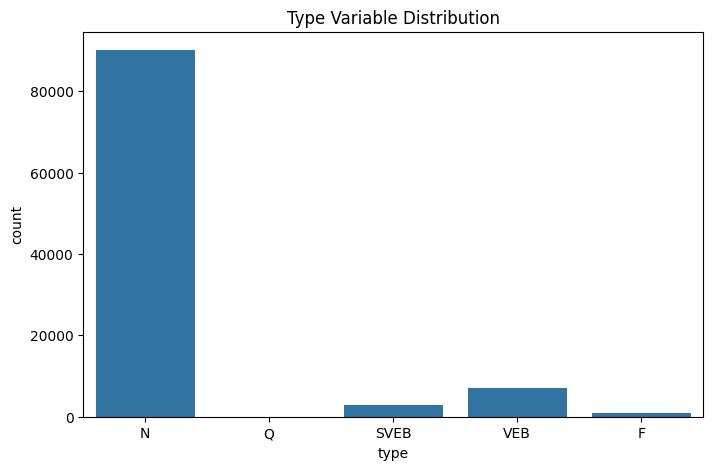

In [48]:
#bar chart for type 
#benefit: according to these output we can see that there are more types of data than the other types of data. (normal > other types) imbalances - Balanced random forest classifier
plt.figure(figsize=(8,5))
sns.countplot(x='type', data=df)
plt.title('Type Variable Distribution')
plt.show()

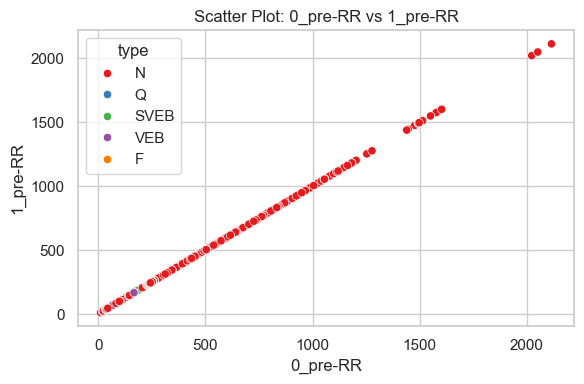

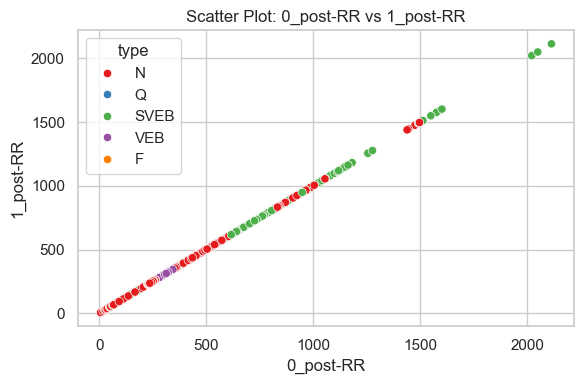

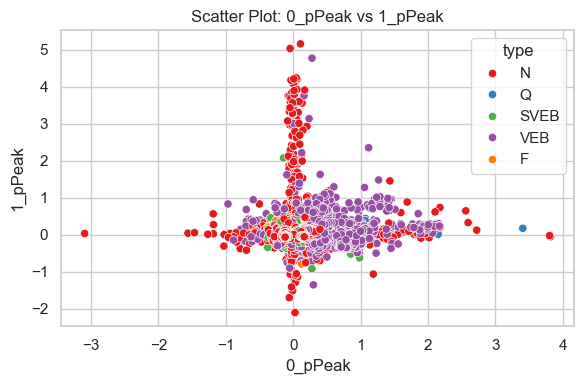

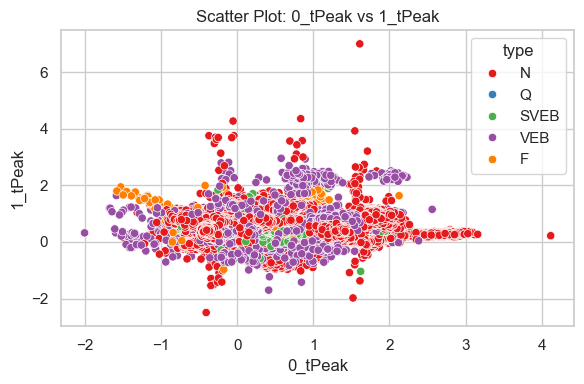

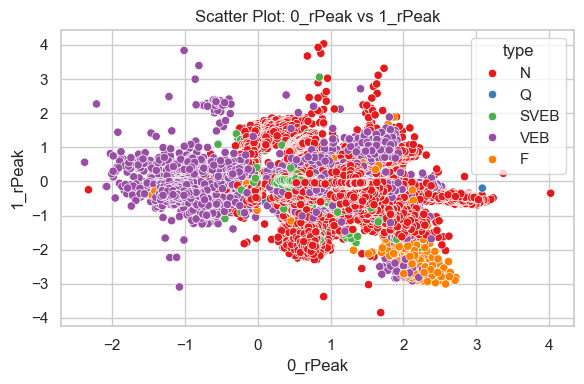

...

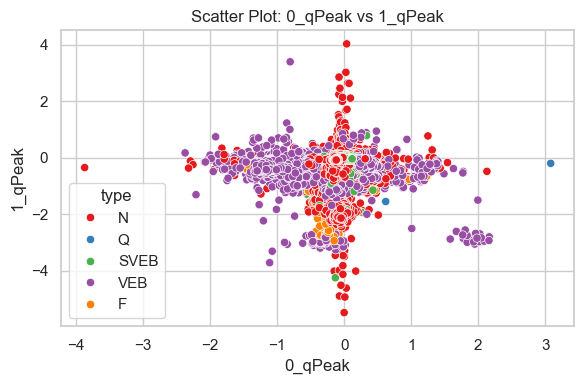

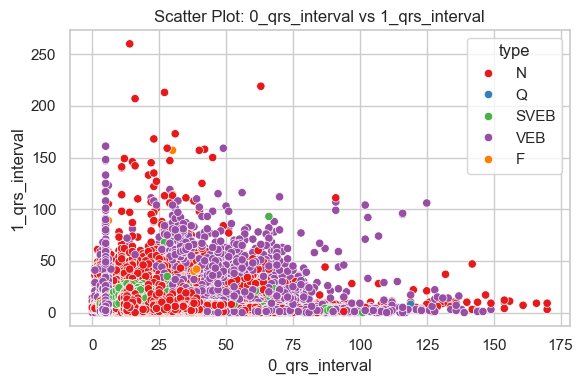

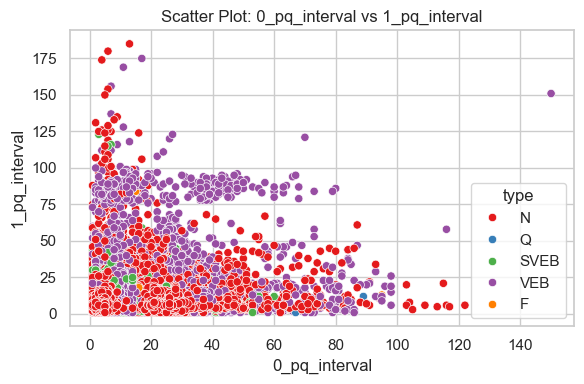

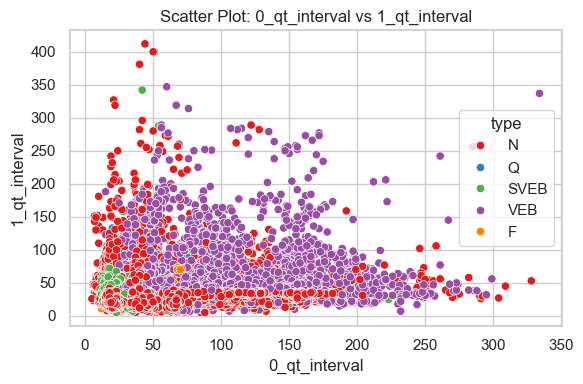

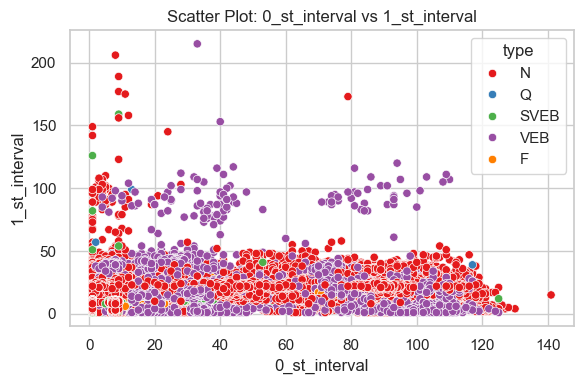

In [129]:
# #1)EDA
# 1.1) Scatter diagram with a categorical reference
# benefit: exploring relationships between two numerical variables. -> we can drop 
# Optional: set style
sns.set(style="whitegrid")

# Use this list for common feature suffixes
feature_names = ['pre-RR', 'post-RR', 'pPeak', 'tPeak', 'rPeak', 'sPeak', 'qPeak',
                 'qrs_interval', 'pq_interval', 'qt_interval', 'st_interval']

# Loop through feature names and plot corresponding 0_ and 1_ versions
for feature in feature_names:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(
        x=f'0_{feature}', 
        y=f'1_{feature}', 
        hue='type',  # color-coded by arrhythmia type
        data=df,
        palette='Set1'
    )
    plt.title(f'Scatter Plot: 0_{feature} vs 1_{feature}')
    plt.xlabel(f'0_{feature}')
    plt.ylabel(f'1_{feature}')
    plt.tight_layout()
    plt.show()


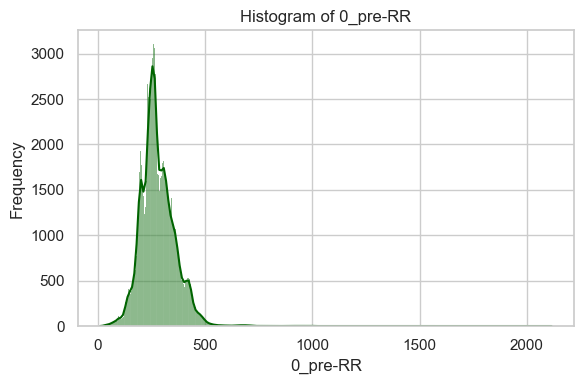

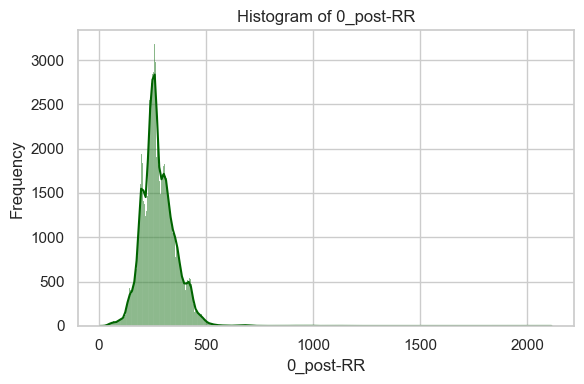

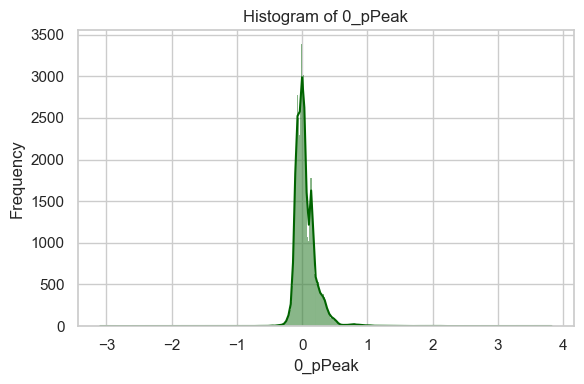

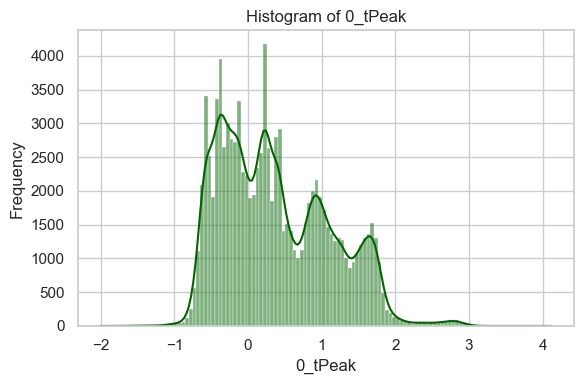

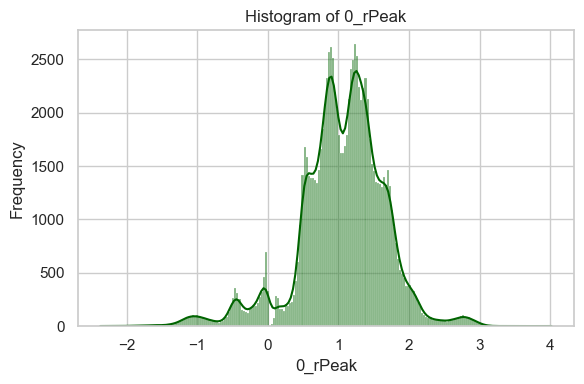

...

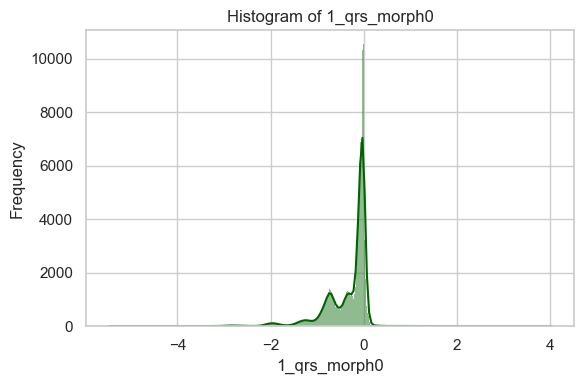

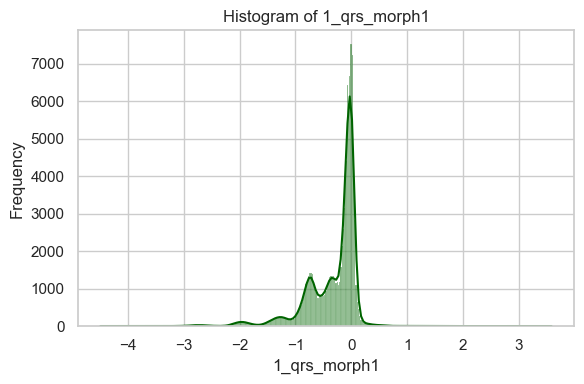

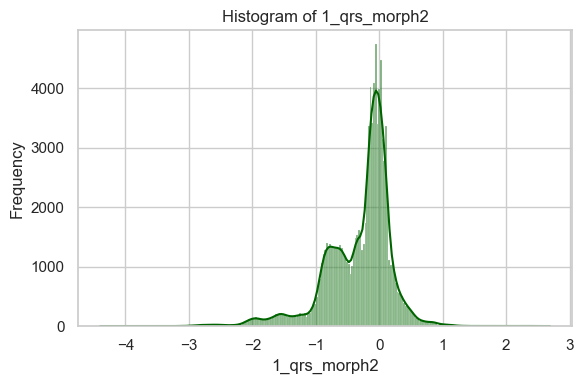

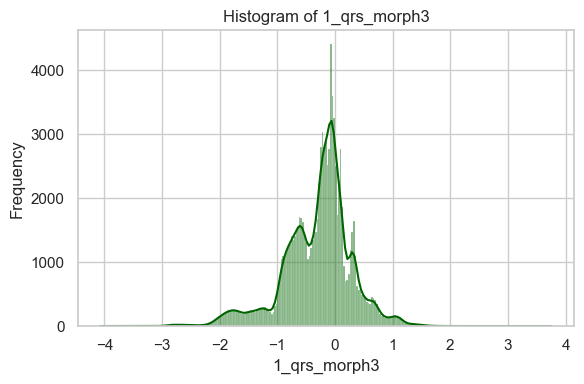

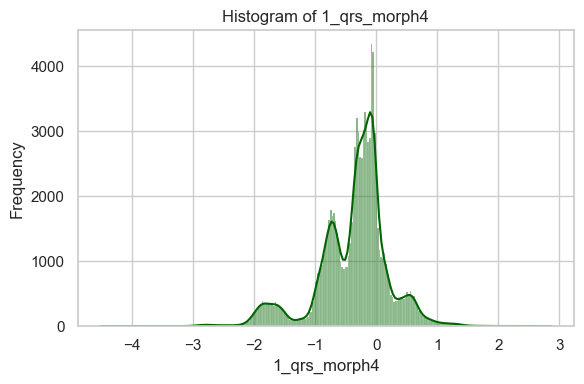

In [130]:
# # 1.2) Histogram for distributions
#benefit: Understanding the Spread: Histograms show how data is distributed , to know outliers - skweness 
# List of features you want to plot (excluding 'record' and 'type')
features = ['0_pre-RR', '0_post-RR', '0_pPeak', '0_tPeak', '0_rPeak', '0_sPeak', '0_qPeak',
            '0_qrs_interval', '0_pq_interval', '0_qt_interval', '0_st_interval',
            '0_qrs_morph0', '0_qrs_morph1', '0_qrs_morph2', '0_qrs_morph3', '0_qrs_morph4',
            '1_pre-RR', '1_post-RR', '1_pPeak', '1_tPeak', '1_rPeak', '1_sPeak', '1_qPeak',
            '1_qrs_interval', '1_pq_interval', '1_qt_interval', '1_st_interval',
            '1_qrs_morph0', '1_qrs_morph1', '1_qrs_morph2', '1_qrs_morph3', '1_qrs_morph4']

# Loop through each feature and plot histogram
for feature in features:
    plt.figure(figsize=(6, 4))
    sns.histplot(data=df, x=feature, kde=True, color="darkgreen")
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


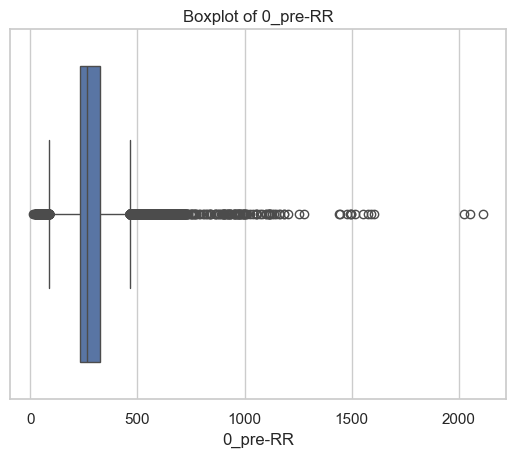

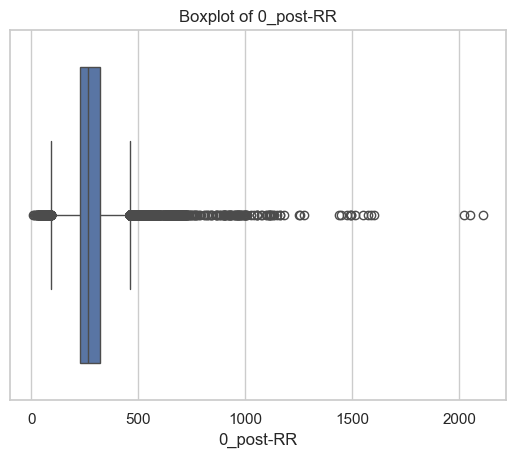

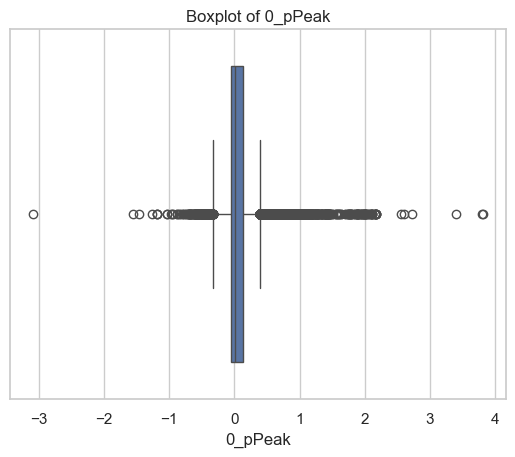

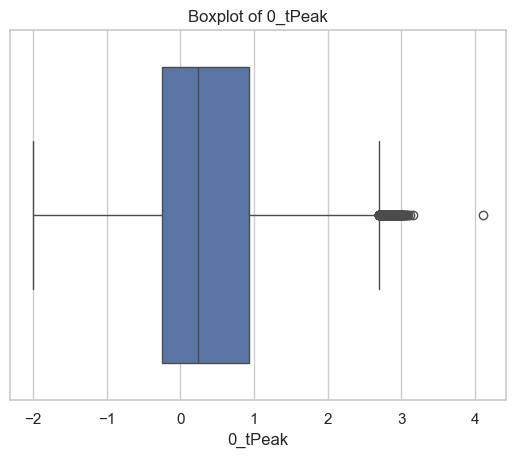

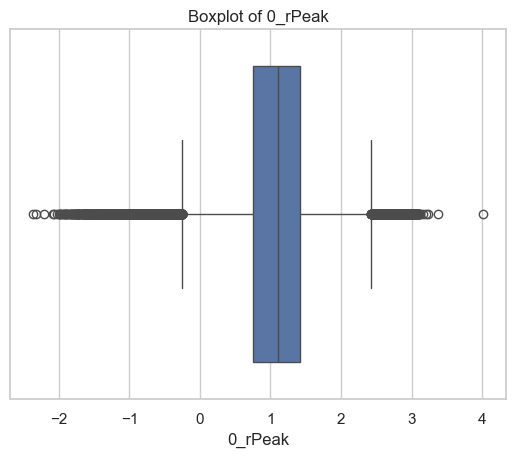

...

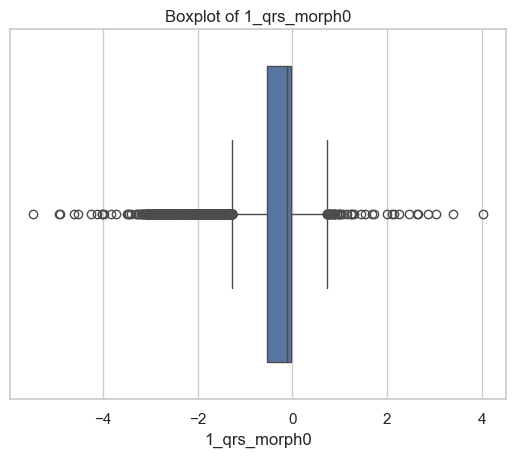

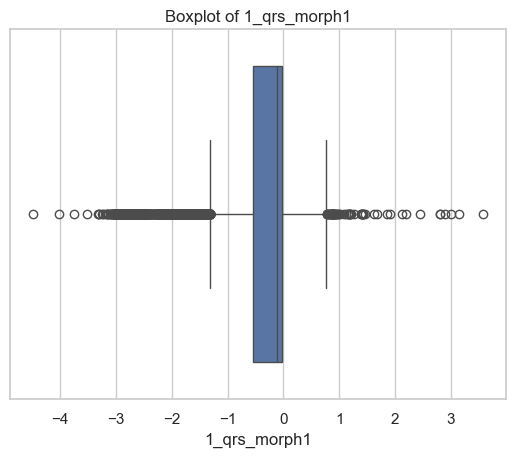

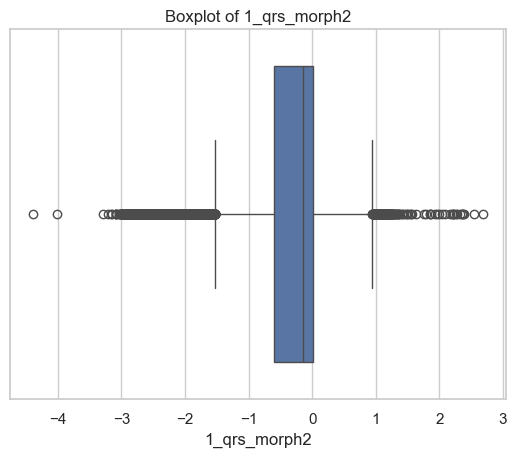

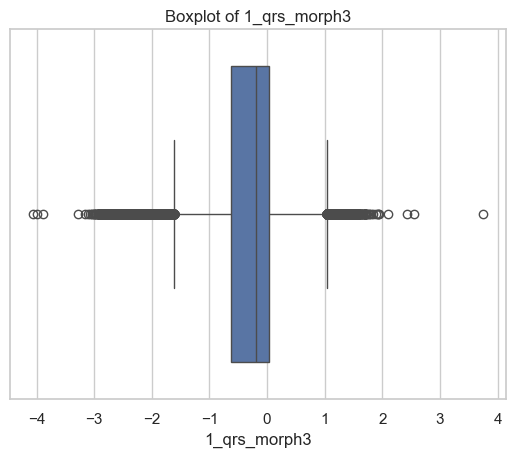

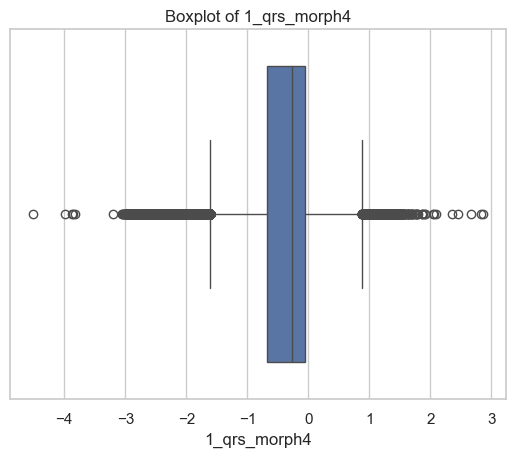

In [131]:
# # 1.3) Boxplots to show outliers
for feature in features:
    sns.boxplot(x=df[feature])
    plt.title(f'Boxplot of {feature}')
    plt.show()



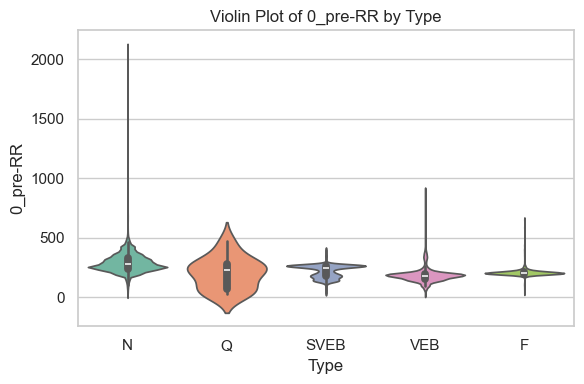

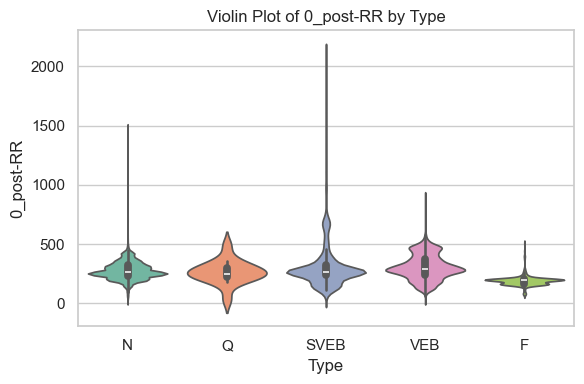

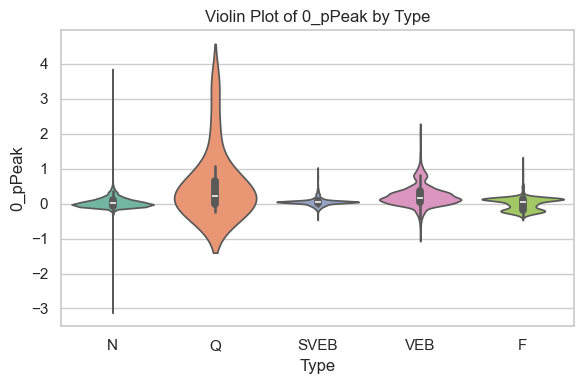

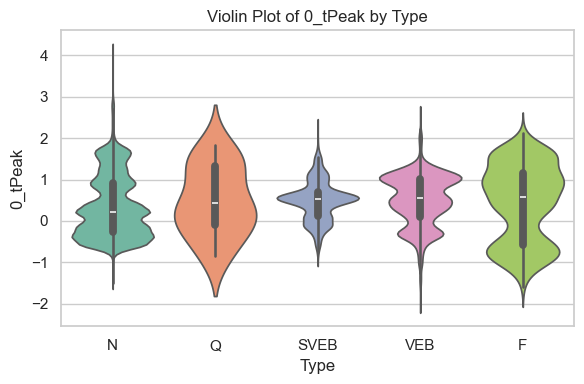

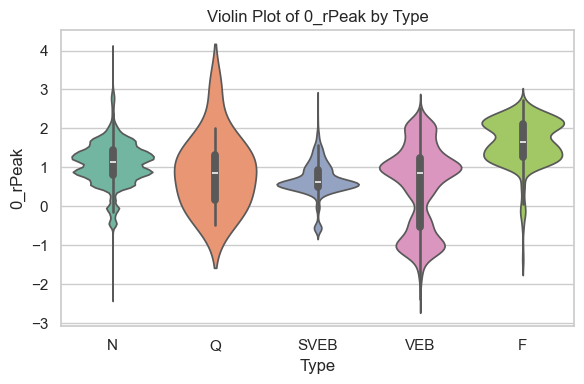

...

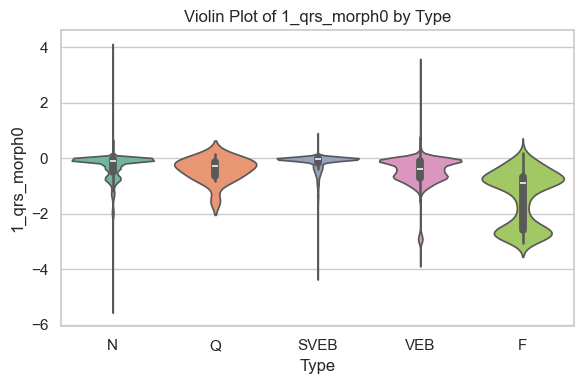

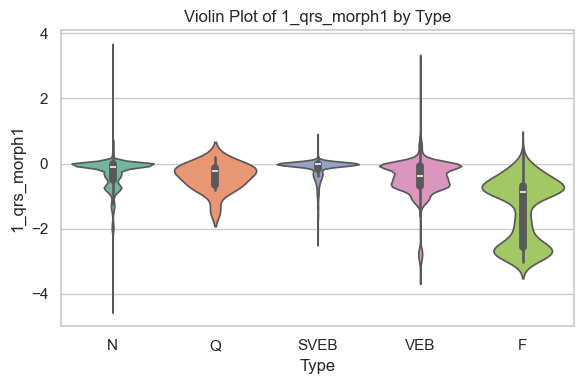

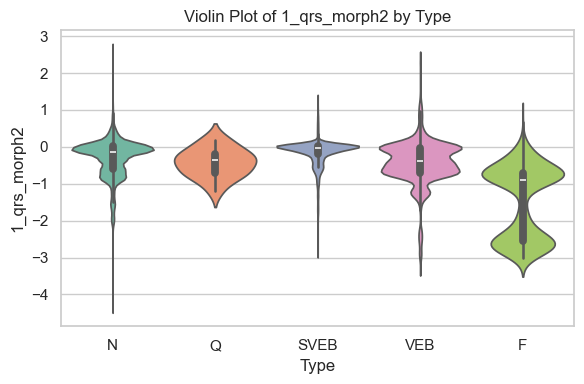

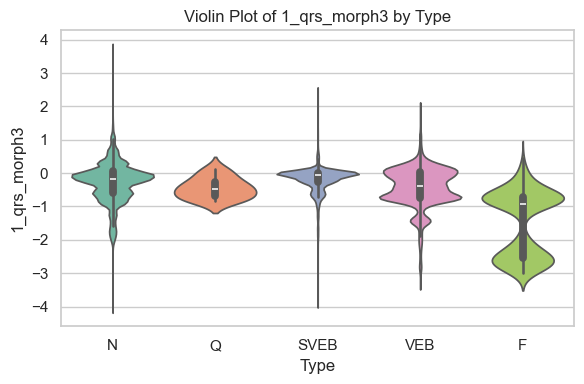

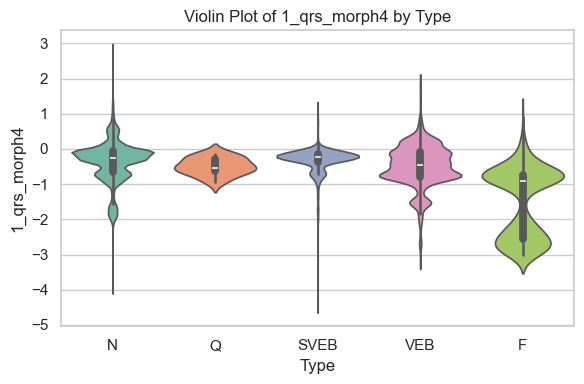

In [132]:
#1.4)Loop through features and plot violin plots
#benefit: outliers - modes - density
for feature in features:
    plt.figure(figsize=(6, 4))
    sns.violinplot(data=df, x='type', y=feature, hue='type', palette="Set2", legend=False)
    plt.title(f'Violin Plot of {feature} by Type')
    plt.xlabel('Type')
    plt.ylabel(feature)
    plt.tight_layout()
    plt.show()


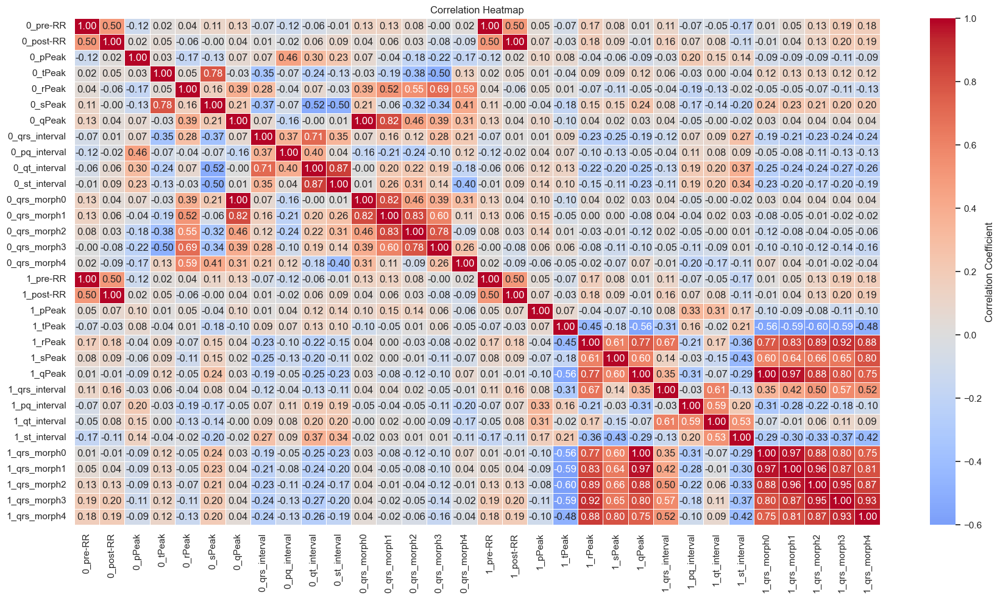

In [133]:
#1.5)using correlation 
new_df_without_record = df.drop(columns=["record"])
v=(new_df_without_record.corr(numeric_only=True))

#1.9)using heatmap
plt.figure(figsize=(18,10))
sns.heatmap(
    v,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",   # Matching your image's color palette
    center=0,
    vmin=-0.6, vmax=1.0,
    linewidths=0.5,
    square=False,
    cbar_kws={'label': 'Correlation Coefficient'}
)

plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

In [44]:
#2)Data preprocessing
#2.1)
df.isnull().sum().sum()


np.int64(0)

In [45]:
# 2.2)
df.duplicated()
df.duplicated().sum()

np.int64(0)

In [46]:
#2.3)Spliting insurance data into training and test training data set:

from sklearn.model_selection import train_test_split
#To gat x  and y features we will need to slice our dataframe
x= df.drop(columns=["record","type"],axis="columns")
pd.set_option('future.no_silent_downcasting', True)
y = df["type"].replace({"N": 1, "Q": 2, "SVEB": 3, "VEB": 4, "F": 5}) #we can do label encoding for y

#2.4)remove the outliers 
#without reducing our data too much , first e will determined the lower and the upper threshold values for outliers
def outliers_thresholds (dataframe , col_name ,q1=0.25 , q3=0.75):  # from boxplot you can understand (0.05 and 0.095)
    quartile1 = dataframe [col_name].quantile(q1)
    quartile3 = dataframe [col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    upper_limit = quartile3 +1.5*  interquantile_range
    lower_limit = quartile1 -1.5*  interquantile_range
    return lower_limit , upper_limit


#check if there outliers according to the threshold values we have determined
def check_outliers (dataframe , col_name):
    lower_limit , upper_limit = outliers_thresholds(dataframe , col_name)
    if dataframe[(dataframe[col_name]>upper_limit) | (dataframe[col_name]<lower_limit)].any(axis=None):
        return True 
    else :
        return False 
    
# Loop through the arrhythmia features and check for outliers
for feature in x.keys():
    print(f"{feature}: {'Outliers found' if check_outliers(df, feature) else 'No outliers'}")

    
#let's suppress the variables with outliers with the threshold value we determned
def replace_with_thresholds(dataframe , variable):
    lower_limit , upper_limit = outliers_thresholds(dataframe , variable)
    dataframe[variable] = dataframe[variable].astype(float)
    dataframe.loc[(dataframe[variable]<lower_limit),variable]=lower_limit 
    dataframe.loc[(dataframe[variable]>upper_limit),variable]=upper_limit 
for feature in x.keys() :
    (feature,replace_with_thresholds(df,feature))

    # #checked again and we have solved the outlier problem finallllly
for feature in x.keys():
    if check_outliers(df, feature):  # still has outliers after capping
        print(f"{feature}: Still has outliers")
    else:
        print(f"{feature}: Outliers capped")


0_pre-RR: Outliers found
0_post-RR: Outliers found
0_pPeak: Outliers found
0_tPeak: Outliers found
0_rPeak: Outliers found
0_sPeak: Outliers found
0_qPeak: Outliers found
0_qrs_interval: Outliers found
0_pq_interval: Outliers found
0_qt_interval: Outliers found
0_st_interval: Outliers found
0_qrs_morph0: Outliers found
0_qrs_morph1: Outliers found
0_qrs_morph2: Outliers found
0_qrs_morph3: Outliers found
0_qrs_morph4: Outliers found
1_pre-RR: Outliers found
1_post-RR: Outliers found
1_pPeak: Outliers found
1_tPeak: Outliers found
1_rPeak: Outliers found
1_sPeak: Outliers found
1_qPeak: Outliers found
1_qrs_interval: Outliers found
1_pq_interval: Outliers found
1_qt_interval: Outliers found
1_st_interval: Outliers found
1_qrs_morph0: Outliers found
1_qrs_morph1: Outliers found
1_qrs_morph2: Outliers found
1_qrs_morph3: Outliers found
1_qrs_morph4: Outliers found
0_pre-RR: Outliers capped
0_post-RR: Outliers capped
0_pPeak: Outliers capped
0_tPeak: Outliers capped
0_rPeak: Outliers cappe

In [47]:
# #2.5) Scaling for x  x.head after scaling will give error because it turns to array'numpy.ndarray' object has no attribute 'head'
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
x=scaler.fit_transform(x)


In [48]:
df

,record,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,...,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval,1_qrs_morph0,1_qrs_morph1,1_qrs_morph2,1_qrs_morph3,1_qrs_morph4
0,101,N,89.0,313.0,0.074347,-0.160548,1.036401,-0.285662,-0.026824,41.0,...,0.025930,2.0,18.0,22.0,2.0,0.025930,0.025930,0.025930,0.025436,0.025436
1,101,N,313.0,315.0,-0.052079,-0.264784,0.886597,-0.366298,-0.059710,21.0,...,-0.042009,26.0,25.0,62.0,9.0,-0.042009,-0.029498,0.005012,0.030892,0.002986
2,101,N,315.0,321.0,-0.062151,-0.296983,0.991859,-0.410306,-0.065686,22.0,...,0.009528,3.0,8.0,12.0,1.0,0.009528,0.009528,0.008786,0.008786,0.008368
3,101,N,321.0,336.0,-0.063322,-0.281386,1.034903,-0.403880,-0.071750,22.0,...,-0.020536,6.0,9.0,16.0,1.0,-0.020536,-0.020257,-0.018965,-0.016968,-0.014555
4,101,N,336.0,344.0,-0.062915,1.046914,1.046408,1.046408,-0.074639,11.0,...,0.016053,16.0,5.0,31.0,10.0,0.016053,0.006742,0.002782,-0.007798,-0.051155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100684,234,N,240.0,241.0,-0.110230,1.420339,1.403346,1.403346,-0.115682,14.0,...,-0.069234,5.0,6.0,20.0,9.0,-0.069234,-0.068378,-0.065373,-0.060779,-0.054383
100685,234,N,241.0,243.0,-0.119014,1.424782,1.420328,1.420328,-0.134406,13.0,...,-0.069530,7.0,5.0,20.0,8.0,-0.069530,-0.069290,-0.066317,-0.053437,-0.045120
100686,234,N,243.0,252.0,0.173524,-0.443214,1.436878,-0.714642,-0.136431,38.0,...,-0.089396,9.0,7.0,24.0,8.0,-0.089396,-0.088155,-0.078611,-0.066763,-0.058650
100687,234,N,252.0,244.0,-0.119820,-0.401522,1.337051,-0.688560,-0.125076,27.0,...,-0.065487,3.0,1.0,12.0,8.0,-0.065487,-0.065487,-0.064941,-0.064941,-0.061120


In [49]:
#2.6)Use split function to split our train and test data
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.25,random_state=42, stratify=y) #stratify=y to make sure the test size has the same distribution of classes as the original dataset.
#randome_state=42 to make sure the split is reproducible
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)


(75516, 32)
(25173, 32)
(75516,)
(25173,)


In [51]:
#3)Initate ML model
#3.1)Logistic Model 
# Create encoder
le = LabelEncoder()

#4.1)Fit Logistic Model
# Fit and transform y labels
y_train_encoded = le.fit_transform(y_train) 
y_test_encoded = le.transform(y_test)


model1 = LogisticRegression(penalty='l2',   #prevent overfitting (hyperparameter)
    C=0.01, # regularization parameter
    solver='lbfgs',  
    max_iter=1000,  
    random_state=42)  

model1.fit(x_train, y_train_encoded)



train_acc_log = accuracy_score(y_train_encoded, model1.predict(x_train))
test_acc_log = accuracy_score(y_test_encoded, model1.predict(x_test))
print(f"Logistic Regression Train Accuracy: {train_acc_log}")
print(f"Logistic Regression Test Accuracy: {test_acc_log}")


Logistic Regression Train Accuracy: 0.9463689814079136
Logistic Regression Test Accuracy: 0.9473245143606245


In [56]:
#GridSearch for Best Hyperparameters
param_grid_log = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['lbfgs', 'liblinear'],
    'max_iter': [500, 1000, 1500]
}
#GridSearchCV: Trains multiple models using all combinations in param_grid_log.
#Uses cross-validation to evaluate each model.
grid_log = GridSearchCV(LogisticRegression(random_state=42), param_grid_log, cv=5, n_jobs=2) # Uses all available CPU cores for speed. cv->cross validation folds (partsof the data used to train and test the model)
grid_log.fit(x_train, y_train_encoded)
print("Best parameters (Logistic Regression):", grid_log.best_params_)
print("Best CV score (Logistic Regression):", grid_log.best_score_) 


Best parameters (Logistic Regression): {'C': 100, 'max_iter': 500, 'solver': 'lbfgs'}
Best CV score (Logistic Regression): 0.9475607949355105


In [57]:

#Best model
best_log_reg = grid_log.best_estimator_ # best estimator from grid search
print(best_log_reg)
train_y_pred_log_best = best_log_reg.predict(x_train)
test_y_pred_log_best = best_log_reg.predict(x_test)
#output
train_acc_log = accuracy_score(y_train_encoded, train_y_pred_log_best)
test_acc_log = accuracy_score(y_test_encoded, test_y_pred_log_best)
print(f"Best Random Forest Train Accuracy: {train_acc_log}")
print(f"Best Random Forest Test Accuracy: {test_acc_log}")


LogisticRegression(C=100, max_iter=500, random_state=42)
Best Random Forest Train Accuracy: 0.9478918374913925
Best Random Forest Test Accuracy: 0.9489532435546022


In [60]:
train_y_pred_log_best_labels = le.inverse_transform(train_y_pred_log_best)
test_y_pred_log_best_labels = le.inverse_transform(test_y_pred_log_best)
print("Predicted labels after applying best model:",test_y_pred_log_best_labels[:20])
print("Original test labels:",y_test[:20])


Predicted labels after applying best model: [1 1 1 1 1 1 1 1 1 1 1 1 4 4 1 1 1 1 1 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object


In [61]:
# Cross-Validation on Best Model
# Ensure y is a Series of integers
y = pd.Series(y).astype(int)
#Run 5-fold cross-validation on the entire dataset using the best model.
cv_scores_log = cross_val_score(best_log_reg, x , y, cv=5, scoring='accuracy') #Accuracy
print("Cross-Validation Scores (Logistic Regression):", cv_scores_log) 
print("Average CV Score (Logistic Regression):", np.mean(cv_scores_log))  
print("Standard Deviation of CV Scores (Logistic Regression):", np.std(cv_scores_log))  #(how much the scores vary — lower is better).


Cross-Validation Scores (Logistic Regression): [0.91374516 0.91657563 0.93082729 0.95103784 0.93996127]
Average CV Score (Logistic Regression): 0.9304294365007978
Standard Deviation of CV Scores (Logistic Regression): 0.014042887455548209


In [62]:
#3.2)Decision Tree 
model2=DecisionTreeClassifier(    
    criterion='gini',
    max_depth=1, # Limits tree depth to prevent overfitting (very shallow)
    min_samples_split=100,
    min_samples_leaf=50,
    random_state=42)

#4.2)Fit Model
model2.fit(x_train , y_train_encoded)

train_acc_tree = accuracy_score(y_train_encoded, model2.predict(x_train))
test_acc_tree = accuracy_score(y_test_encoded,model2.predict(x_test))

print(f"Decision Tree Train Accuracy: {train_acc_tree}")
print(f"Decision Tree Test Accuracy: {test_acc_tree}")

Decision Tree Train Accuracy: 0.8946713279305047
Decision Tree Test Accuracy: 0.894649028721249


In [ ]:
param_grid_tree = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [50,60,70],
    'min_samples_leaf': [1, 2, 3]
}
grid_tree = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid_tree, cv=5, n_jobs=-1)
grid_tree.fit(x_train, y_train_encoded)
print("Best parameters (Decision Tree):", grid_tree.best_params_)
print("Best CV score (Decision Tree):", grid_tree.best_score_)



Best parameters (Decision Tree): {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 50}
Best CV score (Decision Tree): 0.9691720936784926


In [ ]:

best_tree = grid_tree.best_estimator_
train_y_pred_tree_best = best_tree.predict(x_train)
test_y_pred_tree_best = best_tree.predict(x_test)
#output
train_acc_tree = accuracy_score(y_train_encoded, train_y_pred_tree_best)
test_acc_nb_tree = accuracy_score(y_test_encoded, test_y_pred_tree_best)
print(f"Best Random Forest Train Accuracy: {train_acc_tree}")
print(f"Best Random Forest Test Accuracy: {test_acc_tree}")



Best Random Forest Train Accuracy: 0.9745087133852428
Best Random Forest Test Accuracy: 0.894649028721249


In [ ]:

train_y_pred_tree_best_labels = le.inverse_transform(train_y_pred_tree_best)
test_y_pred_tree_best_labels = le.inverse_transform(test_y_pred_tree_best)
print("Predicted labels after applying best model:",test_y_pred_tree_best_labels[:20])
print("Original test labels:",y_test[:20])
print("Decision Tree Best Model Test Accuracy:", accuracy_score(y_test_encoded, test_y_pred_tree_best))



Predicted labels after applying best model: [1 1 1 1 1 1 1 1 1 1 1 1 4 4 1 1 1 1 1 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object
Decision Tree Best Model Test Accuracy: 0.9711993008381996


In [ ]:

cv_scores_tree = cross_val_score(best_tree, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores (Decision Tree):", cv_scores_tree)
print("Average CV Score (Decision Tree):", np.mean(cv_scores_tree))
print("Standard Deviation of CV Scores (Decision Tree):", np.std(cv_scores_tree)) 



Cross-Validation Scores (Decision Tree): [0.89418016 0.80608799 0.95029298 0.96201212 0.95187962]
Average CV Score (Decision Tree): 0.9128905738367721
Standard Deviation of CV Scores (Decision Tree): 0.058461753135405616


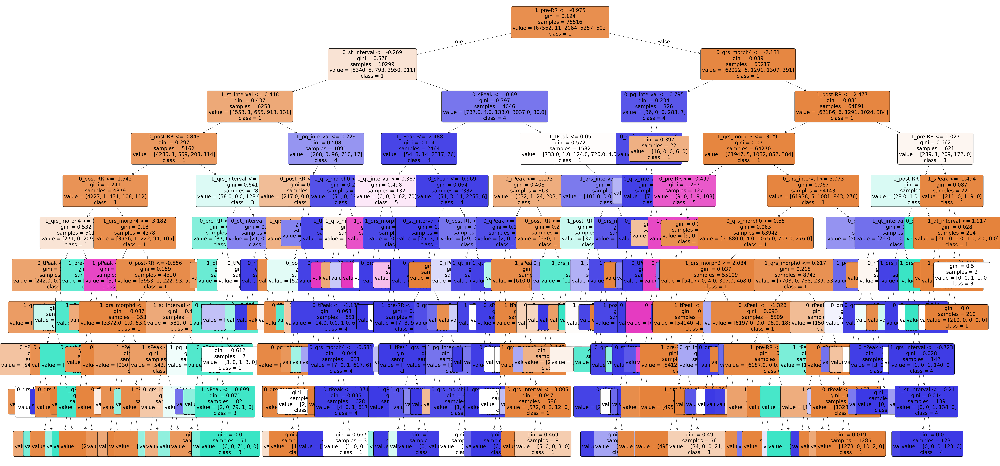

In [66]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

features = ['0_pre-RR', '0_post-RR', '0_pPeak', '0_tPeak', '0_rPeak', '0_sPeak', '0_qPeak',
            '0_qrs_interval', '0_pq_interval', '0_qt_interval', '0_st_interval',
            '0_qrs_morph0', '0_qrs_morph1', '0_qrs_morph2', '0_qrs_morph3', '0_qrs_morph4',
            '1_pre-RR', '1_post-RR', '1_pPeak', '1_tPeak', '1_rPeak', '1_sPeak', '1_qPeak',
            '1_qrs_interval', '1_pq_interval', '1_qt_interval', '1_st_interval',
            '1_qrs_morph0', '1_qrs_morph1', '1_qrs_morph2', '1_qrs_morph3', '1_qrs_morph4']
plt.figure(figsize=(100, 50))
# Assuming you still have the original DataFrame
class_names = [str(cls) for cls in le.classes_]
plot_tree(best_tree, feature_names=features , class_names=class_names, filled=True, rounded=True,fontsize=30)
plt.show()

In [ ]:
#3.4) Naive Bayes
model4 = GaussianNB()

#4.4) Fit Base Model
model4.fit(x_train, y_train_encoded)

#5.4) Evaluate Base Model
train_acc_nb = accuracy_score(y_train_encoded, model4.predict(x_train))
test_acc_nb = accuracy_score(y_test_encoded, model4.predict(x_test))

print(f"Naive Bayes Base Train Accuracy: {train_acc_nb}")
print(f"Naive Bayes Base Test Accuracy: {test_acc_nb}")


Naive Bayes Base Train Accuracy: 0.7038243551035542
Naive Bayes Base Test Accuracy: 0.7071862710046478


In [ ]:

#6.4) Hyperparameter Tuning
#adds a small constant to the variances of each feature to prevent division by zero and stabilize the calculation when variances are very small.
param_grid_nb = {
    'var_smoothing': np.logspace(-12, -6, 7)  # Test values from 1e-12 to 1e-6
}

grid_nb = GridSearchCV(GaussianNB(), param_grid_nb, cv=5, n_jobs=-1)
grid_nb.fit(x_train, y_train_encoded)
print("Best parameters (Naive Bayes):", grid_nb.best_params_)
print("Best CV score (Naive Bayes):", grid_nb.best_score_)


Best parameters (Naive Bayes): {'var_smoothing': np.float64(1e-12)}
Best CV score (Naive Bayes): 0.7039833030001896


In [ ]:

#7.4) Evaluate Best Model
best_nb = grid_nb.best_estimator_
train_y_pred_nb_best = best_nb.predict(x_train)
test_y_pred_nb_best = best_nb.predict(x_test)
#output

train_acc_nb = accuracy_score(y_train_encoded, train_y_pred_nb_best)
test_acc_nb = accuracy_score(y_test_encoded, test_y_pred_nb_best)
print(f"Best Naive Bayes Train Accuracy: {train_acc_nb}")
print(f"Best Naive Bayes Test Accuracy: {test_acc_nb}")

Best Random Forest Train Accuracy: 0.7038243551035542
Best Random Forest Test Accuracy: 0.7071862710046478


In [ ]:


train_y_pred_nb_best_labels = le.inverse_transform(train_y_pred_nb_best)
test_y_pred_nb_best_labels = le.inverse_transform(test_y_pred_nb_best)
print("Predicted labels (Naive Bayes Best Model):", test_y_pred_nb_best_labels[:20])
print("Original test labels:", y_test[:20])
print("Naive Bayes Best Model Test Accuracy:", accuracy_score(y_test_encoded, test_y_pred_nb_best))

Predicted labels (Naive Bayes Best Model): [1 3 4 1 1 1 1 3 1 3 2 1 4 4 1 1 1 1 3 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object
Naive Bayes Best Model Test Accuracy: 0.7071862710046478


In [ ]:


#8.4) Cross-Validation
cv_scores_nb = cross_val_score(best_nb, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores (Naive Bayes):", cv_scores_nb)
print("Average CV Score (Naive Bayes):", np.mean(cv_scores_nb))
print("Standard Deviation of CV Scores (Naive Bayes):", np.std(cv_scores_nb))


Cross-Validation Scores (Naive Bayes): [0.79064455 0.57677029 0.67265866 0.80708114 0.661022  ]
Average CV Score (Naive Bayes): 0.7016353264673681
Standard Deviation of CV Scores (Naive Bayes): 0.08616476117625543


In [52]:
#3.3)Random Forest
import tqdm

model3=RandomForestClassifier(   
    class_weight='balanced',
    n_estimators=50,
    criterion='gini',
    max_depth=5,
    min_samples_split=100,
    min_samples_leaf=2,
    max_features='sqrt',
    random_state=42)

#4.3)Fit Model
model3.fit(x_train , y_train_encoded)


train_acc_rf = accuracy_score(y_train_encoded, model3.predict(x_train))
test_acc_rf = accuracy_score(y_test_encoded, model3.predict(x_test))
print(f"Random Forest Train Accuracy: {train_acc_rf}")
print(f"Random Forest Test Accuracy: {test_acc_rf}")


Random Forest Train Accuracy: 0.853540971449759
Random Forest Test Accuracy: 0.8568307313391332


In [53]:

param_grid_rf = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 7, 10],
    'min_samples_split': [50,100,150],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['sqrt', 'log2']
}

print("Preparing GridSearchCV for Random Forest (this will take a while)...")

# Fake tqdm bar to simulate loading
total_steps = len(param_grid_rf['n_estimators']) * len(param_grid_rf['max_depth']) * len(param_grid_rf['min_samples_split']) * len(param_grid_rf['min_samples_leaf']) * len(param_grid_rf['max_features'])
with tqdm.tqdm(total=total_steps, desc="Grid Search Progress") as pbar:
    grid_rf = GridSearchCV(
        RandomForestClassifier(random_state=42),
        param_grid_rf,
        cv=5,
        n_jobs=-1,
        verbose=3
    )
    grid_rf.fit(x_train, y_train_encoded)
    pbar.update(total_steps)

print("Best parameters (Random Forest):", grid_rf.best_params_)
print("Best CV score (Random Forest):", grid_rf.best_score_)

Preparing GridSearchCV for Random Forest (this will take a while)...


Grid Search Progress:   0%|          | 0/162 [00:00<?, ?it/s]

Fitting 5 folds for each of 162 candidates, totalling 810 fits


Grid Search Progress: 100%|██████████| 162/162 [4:34:58<00:00, 101.85s/it]

Best parameters (Random Forest): {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 50, 'n_estimators': 50}
Best CV score (Random Forest): 0.9720589145564862


In [54]:
best_rf = grid_rf.best_estimator_
train_y_pred_rf_best = best_rf.predict(x_train)
test_y_pred_rf_best = best_rf.predict(x_test)
#output
train_acc_rf = accuracy_score(y_train_encoded, train_y_pred_rf_best)
test_acc_rf = accuracy_score(y_test_encoded, test_y_pred_rf_best)
print(f"Best Random Forest Train Accuracy: {train_acc_rf}")
print(f"Best Random Forest Test Accuracy: {test_acc_rf}")


Best Random Forest Train Accuracy: 0.9744292600243657
Best Random Forest Test Accuracy: 0.9717951773725817


In [55]:


train_y_pred_rf_best_labels = le.inverse_transform(train_y_pred_rf_best)
test_y_pred_rf_best_labels = le.inverse_transform(test_y_pred_rf_best)
print("Predicted labels after applying best model:",test_y_pred_rf_best_labels[:20])
print("Original test labels:",y_test[:20])
print("Random Forest Best Model Test Accuracy:", accuracy_score(y_test_encoded,test_y_pred_rf_best))


Predicted labels after applying best model: [1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object
Random Forest Best Model Test Accuracy: 0.9717951773725817


In [ ]:
cv_scores_rf = cross_val_score(best_rf, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores (Random Forest):", cv_scores_rf)
print("Average CV Score (Random Forest):", np.mean(cv_scores_rf))
print("Standard Deviation of CV Scores (Random Forest):", np.std(cv_scores_rf))


In [ ]:
from imblearn.ensemble import BalancedRandomForestClassifier

# 3.3) Balanced Random Forest
model_balanced_rf = BalancedRandomForestClassifier(   
    n_estimators=50,
    criterion='gini',
    max_depth=5,
    min_samples_split=100,
    min_samples_leaf=2,
    max_features='sqrt',
    random_state=42)

# 4.3) Fit Model

model_balanced_rf.fit(x_train, y_train_encoded)

train_acc_balanced_rf = accuracy_score(y_train_encoded, model_balanced_rf.predict(x_train))
test_acc_balanced_rf = accuracy_score(y_test_encoded, model_balanced_rf.predict(x_test))
print(f"Balanced Random Forest Train Accuracy: {train_acc_balanced_rf}")
print(f"Balanced Random Forest Test Accuracy: {test_acc_balanced_rf}")


In [ ]:
# Hyperparameter Grid for Balanced Random Forest
param_grid_balanced_rf = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 7, 10],
    'min_samples_split': [50, 100, 150],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['sqrt', 'log2']
}

print("Preparing GridSearchCV for Balanced Random Forest (this will take a while)...")
# Fake tqdm bar to simulate loading
total_steps = len(param_grid_balanced_rf['n_estimators']) * len(param_grid_balanced_rf['max_depth']) * len(param_grid_balanced_rf['min_samples_split']) * len(param_grid_balanced_rf['min_samples_leaf']) * len(param_grid_balanced_rf['max_features'])
with tqdm.tqdm(total=total_steps, desc="Grid Search Progress") as pbar:
    grid_balanced_rf = GridSearchCV(
        BalancedRandomForestClassifier(random_state=42),
        param_grid_balanced_rf,
        cv=5,
        n_jobs=-1,
        verbose=3
    )
    grid_balanced_rf.fit(x_train, y_train_encoded)
    pbar.update(total_steps)

print("Best parameters (Balanced Random Forest):", grid_balanced_rf.best_params_)
print("Best CV score (Balanced Random Forest):", grid_balanced_rf.best_score_)

In [ ]:

best_balanced_rf = grid_balanced_rf.best_estimator_
train_y_pred_balanced_rf_best = best_balanced_rf.predict(x_train)
test_y_pred_balanced_rf_best = best_balanced_rf.predict(x_test)
# Output the results
train_acc_balanced_rf = accuracy_score(y_train_encoded, train_y_pred_balanced_rf_best)
test_acc_balanced_rf = accuracy_score(y_test_encoded, test_y_pred_balanced_rf_best)
print(f"Balanced Random Forest Classifier Best Model Train Accuracy: {train_acc_balanced_rf}")
print(f"Balanced Random Forest Classifier Best Model Test Accuracy: {test_acc_balanced_rf}")


In [ ]:

train_y_pred_balanced_rf_best_labels = le.inverse_transform(train_y_pred_balanced_rf_best)
test_y_pred_balanced_rf_best_labels = le.inverse_transform(test_y_pred_balanced_rf_best)
print("Predicted labels after applying best model:", test_y_pred_balanced_rf_best_labels[:20])
print("Original test labels:", y_test[:20])
print("Balanced Random Forest Best Model Test Accuracy:", accuracy_score(y_test_encoded, test_y_pred_balanced_rf_best))

In [ ]:


#Evaluate
cv_scores_balanced_rf = cross_val_score(best_balanced_rf, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores (Balanced Random Forest):", cv_scores_balanced_rf)
print("Average CV Score (Balanced Random Forest):", np.mean(cv_scores_balanced_rf))
print("Standard Deviation of CV Scores (Balanced Random Forest):", np.std(cv_scores_balanced_rf))


In [64]:
#3.5)Knn
model5=KNeighborsClassifier(
    n_neighbors=3,
    weights='uniform',
    algorithm='auto',
    leaf_size=30,
    p=2,
    metric='minkowski')

#4.5)Fit Model
model5.fit(x_train , y_train_encoded)

train_acc_knn = accuracy_score(y_train_encoded, model5.predict(x_train))
test_acc_knn = accuracy_score(y_test_encoded, model5.predict(x_test))
print(f"KNN Train Accuracy: {train_acc_knn}")
print(f"KNN Test Accuracy: {test_acc_knn}")


KNN Train Accuracy: 0.9930213464696224
KNN Test Accuracy: 0.9880824693123584


In [65]:

param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}
grid_knn = GridSearchCV(KNeighborsClassifier(), param_grid_knn, cv=5, n_jobs=-1)
grid_knn.fit(x_train, y_train_encoded)
print("Best parameters (KNN):", grid_knn.best_params_)
print("Best CV score (KNN):", grid_knn.best_score_)


Best parameters (KNN): {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best CV score (KNN): 0.9898961909296279


In [69]:

best_knn = grid_knn.best_estimator_
train_y_pred_knn_best = best_knn.predict(x_train)
test_y_pred_knn_best = best_knn.predict(x_test)
# Output the results
train_acc_knn = accuracy_score(y_train_encoded, train_y_pred_knn_best)
test_acc_knn = accuracy_score(y_test_encoded, test_y_pred_knn_best)
print(f"KNN Best Model Train Accuracy: {train_acc_knn}")
print(f"KNN Best Model Test Accuracy: {test_acc_knn}")


KNN Best Model Train Accuracy: 1.0
KNN Best Model Test Accuracy: 0.9904659754498868


In [70]:

train_y_pred_knn_best_labels = le.inverse_transform(train_y_pred_knn_best)
test_y_pred_knn_best_labels = le.inverse_transform(test_y_pred_knn_best)
print("Predicted labels after applying best model:",test_y_pred_knn_best_labels[:20])
print("Original test labels:",y_test[:20])
print("KNN Best Model Test Accuracy:", accuracy_score(y_test_encoded, test_y_pred_knn_best))


Predicted labels after applying best model: [1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object
KNN Best Model Test Accuracy: 0.9904659754498868


In [68]:

# Cross-Validation
cv_scores_knn = cross_val_score(best_knn, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores (KNN):", cv_scores_knn)
print("Average CV Score (KNN):", np.mean(cv_scores_knn))
print("Standard Deviation of CV Scores (KNN):", np.std(cv_scores_knn))

#That warning does not affect your model's performance, accuracy, or plots.

Cross-Validation Scores (KNN): [0.8853908  0.80598868 0.75454365 0.96409773 0.79386204]
Average CV Score (KNN): 0.8407765802169529
Standard Deviation of CV Scores (KNN): 0.07489435765275977


In [71]:
# 3.6) Support Vector Machine (SVM)
from sklearn.svm import SVC

model6 = SVC(
    kernel='rbf',       # Radial Basis Function kernel (default, good for non-linear data)
    C=1.0,              # Regularization parameter; larger values = less regularization
    gamma='scale',      # Kernel coefficient (auto-computed); controls decision boundary smoothness
    probability=True,   # Enables probability estimates (needed for ROC/AUC, etc.)
    random_state=42
)

# 4.6) Fit SVM Model
model6.fit(x_train, y_train_encoded)

# Training and Testing Accuracy
train_acc_svm = accuracy_score(y_train_encoded, model6.predict(x_train))
test_acc_svm = accuracy_score(y_test_encoded, model6.predict(x_test))
print(f"SVM Train Accuracy: {train_acc_svm}")
print(f"SVM Test Accuracy: {test_acc_svm}")


SVM Train Accuracy: 0.987817151332168
SVM Test Accuracy: 0.9855797878679537


In [72]:

# 5.6) Hyperparameter Tuning using GridSearchCV
param_grid_svm = {
    'C': [0.1, 1, 10],
    'gamma': ['scale', 0.01, 0.001],
    'kernel': ['rbf']  # You can include 'linear', 'poly' if needed
}

grid_svm = GridSearchCV(SVC(probability=True, random_state=42), param_grid_svm, cv=5, n_jobs=-1)
grid_svm.fit(x_train, y_train_encoded)
print("Best parameters (SVM):", grid_svm.best_params_)
print("Best CV score (SVM):", grid_svm.best_score_)


Best parameters (SVM): {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best CV score (SVM): 0.9892208371863488


In [73]:

# Best model prediction
best_svm = grid_svm.best_estimator_
train_y_pred_svm_best = best_svm.predict(x_train)
test_y_pred_svm_best = best_svm.predict(x_test)
# Output the results
train_acc_nn = accuracy_score(y_train_encoded, train_y_pred_svm_best )
test_acc_nn = accuracy_score(y_test_encoded, test_y_pred_svm_best)
print(f"SVM Best Model Train Accuracy: {train_acc_nn}")
print(f"SVM Best Model Test Accuracy: {test_acc_nn}")


SVM Best Model Train Accuracy: 0.9948355315429843
SVM Best Model Test Accuracy: 0.9891550470742462


In [74]:

# Convert predictions to original class labels
train_y_pred_svm_best_labels = le.inverse_transform(train_y_pred_svm_best)
test_y_pred_svm_best_labels = le.inverse_transform(test_y_pred_svm_best)
print("Predicted labels after applying best SVM model:", test_y_pred_svm_best_labels[:20])
print("Original test labels:", y_test[:20])
print("SVM Best Model Test Accuracy:", accuracy_score(y_test_encoded, test_y_pred_svm_best))


Predicted labels after applying best SVM model: [1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object
SVM Best Model Test Accuracy: 0.9891550470742462


In [75]:

# Cross-validation on full dataset
cv_scores_svm = cross_val_score(best_svm, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores (SVM):", cv_scores_svm)
print("Average CV Score (SVM):", np.mean(cv_scores_svm))
print("Standard Deviation of CV Scores (SVM):", np.std(cv_scores_svm))


Cross-Validation Scores (SVM): [0.91483762 0.85217003 0.9103188  0.96414738 0.88290212]
Average CV Score (SVM): 0.9048751902087643
Standard Deviation of CV Scores (SVM): 0.037155688106162155


In [76]:
# 3.7) Neural Network - MLPClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

# Initialize the MLPClassifier
model7 = MLPClassifier(
    hidden_layer_sizes=(100,),   # Single hidden layer with 100 neurons
    max_iter=50,                # Maximum number of iterations for training
    random_state=42,             # Random seed for reproducibility
    activation='relu',           # Default activation function: ReLU
    solver='adam',               # Adam optimization algorithm (default)
    learning_rate='constant',    # Learning rate schedule (constant)
    learning_rate_init=0.001,    # Initial learning rate
)

# 4.7) Fit Neural Network Model
model7.fit(x_train, y_train_encoded)
# Training and Testing Accuracy
train_acc_nn = accuracy_score(y_train_encoded, model7.predict(x_train))
test_acc_nn = accuracy_score(y_test_encoded, model7.predict(x_test))
print(f"SVM Train Accuracy: {train_acc_nn}")
print(f"SVM Test Accuracy: {test_acc_nn}")



SVM Train Accuracy: 0.9915249748397691
SVM Test Accuracy: 0.9867318158344258


c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


In [77]:

# Initialize the grid
param_grid = {
    'hidden_layer_sizes': [(50,), (50, 50), (70,)],    # Test different architectures
    'activation': ['relu', 'tanh'],                        # Try different activation functions
    'solver': ['adam', 'sgd'],                             # Test different solvers
    'learning_rate': ['constant', 'adaptive'],             # Test different learning rate strategies
    'max_iter': [50, 100, 150],                           # Test different number of iterations
    'learning_rate_init': [0.001, 0.01, 0.1]              # Test different learning rates
}

# Set up GridSearchCV
grid_search = GridSearchCV(estimator=model7, param_grid=param_grid, cv=5, n_jobs=-1, verbose=3)
grid_search.fit(x_train, y_train_encoded)
print("Best parameters found by GridSearchCV:", grid_search.best_params_)
print("Best parameters (NN):", grid_search.best_params_)
print("Best CV score (NN):", grid_search.best_score_)


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters found by GridSearchCV: {'activation': 'relu', 'hidden_layer_sizes': (50, 50), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_iter': 150, 'solver': 'sgd'}
Best parameters (NN): {'activation': 'relu', 'hidden_layer_sizes': (50, 50), 'learning_rate': 'adaptive', 'learning_rate_init': 0.1, 'max_iter': 150, 'solver': 'sgd'}
Best CV score (NN): 0.9885057632505383


c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


In [78]:

# Get the best model
best_NN = grid_search.best_estimator_
train_pred_encoded_NN = best_NN.predict(x_train)
test_pred_encoded_NN = best_NN.predict(x_test)
# Output the results
train_acc_nn = accuracy_score(y_train_encoded, train_pred_encoded_NN)
test_acc_nn = accuracy_score(y_test_encoded, test_pred_encoded_NN)
print(f"Neural Network (MLPClassifier) Best Model Train Accuracy: {train_acc_nn}")
print(f"Neural Network (MLPClassifier) Best Model Test Accuracy: {test_acc_nn}")


Neural Network (MLPClassifier) Best Model Train Accuracy: 0.9992849197521055
Neural Network (MLPClassifier) Best Model Test Accuracy: 0.9891153219719541


In [79]:

# Convert encoded predictions back to original labels
train_pred_labels_NN = le.inverse_transform(train_pred_encoded_NN)
test_pred_labels_NN = le.inverse_transform(test_pred_encoded_NN)
print("Predicted labels after applying best Neural Network (MLPClassifier)model:", test_pred_labels_NN[:20])
print("Original test labels:", y_test[:20])
print("Neural Network (MLPClassifier) Best Model Test Accuracy:", accuracy_score(y_test_encoded, test_pred_encoded_NN))


Predicted labels after applying best Neural Network (MLPClassifier)model: [1 1 1 1 1 1 1 1 1 1 1 1 1 4 1 1 1 1 1 1]
Original test labels: 12972    1
71766    1
8029     1
64921    1
25518    1
49586    1
15596    1
72397    1
18172    1
66762    1
58051    1
19258    1
28417    1
96140    4
47217    1
28707    1
2838     1
67030    1
41813    1
4297     1
Name: type, dtype: object
Neural Network (MLPClassifier) Best Model Test Accuracy: 0.9891153219719541


In [80]:


# Cross-validation on full dataset
cv_scores_NN = cross_val_score(best_NN, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores Neural Network (MLPClassifier):", cv_scores_NN)
print("Average CV Score Neural Network (MLPClassifier):", np.mean(cv_scores_NN))
print("Standard Deviation of CV Scores Neural Network (MLPClassifier):", np.std(cv_scores_NN))

c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization has

Cross-Validation Scores Neural Network (MLPClassifier): [0.8944781  0.78602642 0.90525375 0.93261496 0.91165516]
Average CV Score Neural Network (MLPClassifier): 0.8860056773777151
Standard Deviation of CV Scores Neural Network (MLPClassifier): 0.05151396623978619


c:\Users\HP\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (150) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc , matthews_corrcoef, cohen_kappa_score, log_loss

#7)Evaluation
def evaluation (test_pred , model):
        #1)
            accuracy = metrics.accuracy_score(y_test_encoded, test_pred)
            recall = metrics.recall_score(y_test_encoded, test_pred, average='macro', zero_division=0)  # Use 'macro' for multiclass
            precision = metrics.precision_score(y_test_encoded, test_pred, average='macro',zero_division=0)  # Use 'macro' for multiclass
            f1_score = metrics.f1_score(y_test_encoded, test_pred, average='macro', zero_division=0)  # Use 'macro' for multiclass
            mcc = metrics.matthews_corrcoef(y_test_encoded, test_pred)
            kappa = metrics.cohen_kappa_score(y_test_encoded, test_pred)
            logloss = metrics.log_loss(y_test_encoded, model.predict_proba(x_test))
            balanced_acc = metrics.balanced_accuracy_score(y_test_encoded, test_pred)
            hamming = metrics.hamming_loss(y_test_encoded, test_pred)
            
            print(f'Model Accuracy = {100*accuracy:0.3} %' )
            print(f'Model recall = {100*recall:0.3} %' )
            print(f'Model precision = {100*precision:0.3} %' )
            print(f'Model f1_score = {100*f1_score:0.3} %' )
            print(f"Matthews Correlation Coefficient = {mcc:.3f}")
            print(f"Cohen’s Kappa = {kappa:.3f}")
            print(f"Log Loss = {logloss:.3f}")
            print(f"Balanced Accuracy = {balanced_acc:.3f}")
            print(f"Hamming Loss = {hamming:.3f}")


        #2)    #confusion Matrix
           # New class label mapping (Note: model classes are 0-indexed)
            label_names = ["N", "Q", "SVEB", "VEB", "F"]  # Corresponds to 0 → N, 1 → Q, etc.

            # Compute the confusion matrix
            cm = confusion_matrix(y_test_encoded, test_y_pred_log_best)

            # Create a DataFrame with proper labels
            cm_df = pd.DataFrame(cm, index=label_names, columns=label_names)

            # Plot the confusion matrix using seaborn
            plt.figure(figsize=(6,6))
            ax = sns.heatmap(cm_df, annot=True, cmap="Blues", fmt="d", linewidths=0.5)
            ax.set_title('Confusion Matrix')
            ax.set_xlabel('Predicted Values')
            ax.set_ylabel('True Values')
            plt.show()
            
        #3)  #class_report
            class_report = metrics.classification_report(y_test_encoded,test_pred, zero_division=0)
            print(class_report)
            
        #4)   #Roc_curve 
        #5)   #AUC
            # One-hot encode your multi-class labels
           # Define your class mapping
            class_map = {1: "N", 2: "Q", 3: "SVEB", 4: "VEB", 5: "F"}

            # Replace the list of class labels with the keys from your mapping
            classes = list(class_map.keys())
            y_test_bin = label_binarize(y_test_encoded, classes=classes)
            n_classes = y_test_bin.shape[1]
            y_score = model.predict_proba(x_test)

            # Plot ROC curve for each class
            plt.figure(figsize=(8, 6))

            for i in range(n_classes):
                if y_test_bin[:, i].sum() == 0:
                    print(f"Skipping class {class_map[classes[i]]} due to no positive samples in y_true.")
                    continue
                fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
                roc_auc = auc(fpr, tpr)
                class_label = class_map[classes[i]]
                plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {roc_auc:.2f})')

            plt.plot([0, 1], [0, 1], 'k--')
            plt.title('Multiclass ROC Curve (One-vs-Rest)')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.legend(loc='lower right')
            plt.grid()
            plt.show()
            return accuracy ,recall,precision , f1_score

Model Accuracy = 94.8 %
Model recall = 44.4 %
Model precision = 61.2 %
Model f1_score = 48.8 %
Matthews Correlation Coefficient = 0.700
Cohen’s Kappa = 0.689
Log Loss = 0.167
Balanced Accuracy = 0.444
Hamming Loss = 0.052


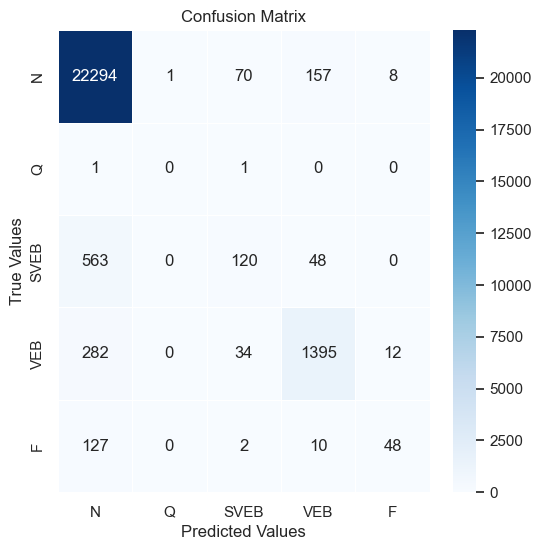

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     22530
           1       0.00      0.00      0.00         2
           2       0.53      0.16      0.25       731
           3       0.87      0.81      0.84      1723
           4       0.71      0.26      0.38       187

    accuracy                           0.95     25173
   macro avg       0.61      0.44      0.49     25173
weighted avg       0.94      0.95      0.94     25173

Skipping class F due to no positive samples in y_true.


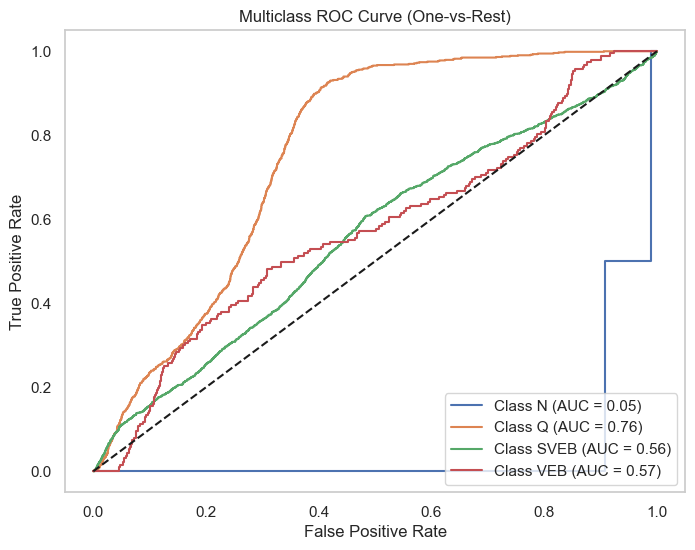

Model Accuracy = 97.8 %
Model recall = 69.6 %
Model precision = 69.3 %
Model f1_score = 69.4 %
Matthews Correlation Coefficient = 0.887
Cohen’s Kappa = 0.887
Log Loss = 0.789
Balanced Accuracy = 0.696
Hamming Loss = 0.022


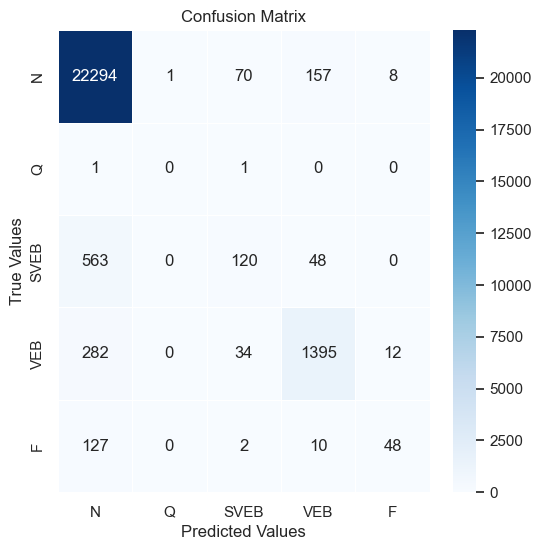

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     22530
           1       0.00      0.00      0.00         2
           2       0.83      0.80      0.82       731
           3       0.92      0.93      0.92      1723
           4       0.72      0.76      0.74       187

    accuracy                           0.98     25173
   macro avg       0.69      0.70      0.69     25173
weighted avg       0.98      0.98      0.98     25173

Skipping class F due to no positive samples in y_true.


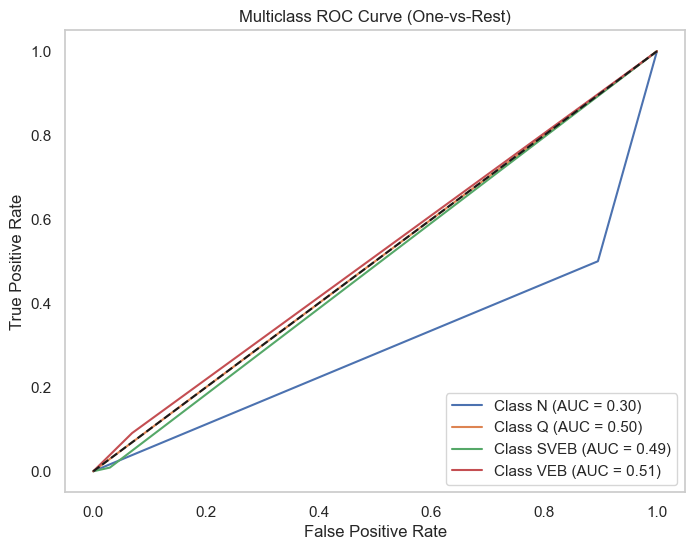

Model Accuracy = 98.9 %
Model recall = 70.9 %
Model precision = 77.8 %
Model f1_score = 74.0 %
Matthews Correlation Coefficient = 0.941
Cohen’s Kappa = 0.941
Log Loss = 0.050
Balanced Accuracy = 0.709
Hamming Loss = 0.011


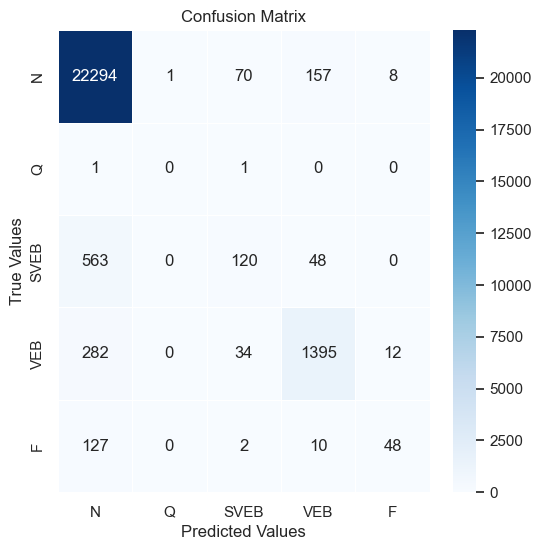

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     22530
           1       0.00      0.00      0.00         2
           2       0.98      0.81      0.88       731
           3       0.98      0.97      0.97      1723
           4       0.95      0.78      0.85       187

    accuracy                           0.99     25173
   macro avg       0.78      0.71      0.74     25173
weighted avg       0.99      0.99      0.99     25173

Skipping class F due to no positive samples in y_true.


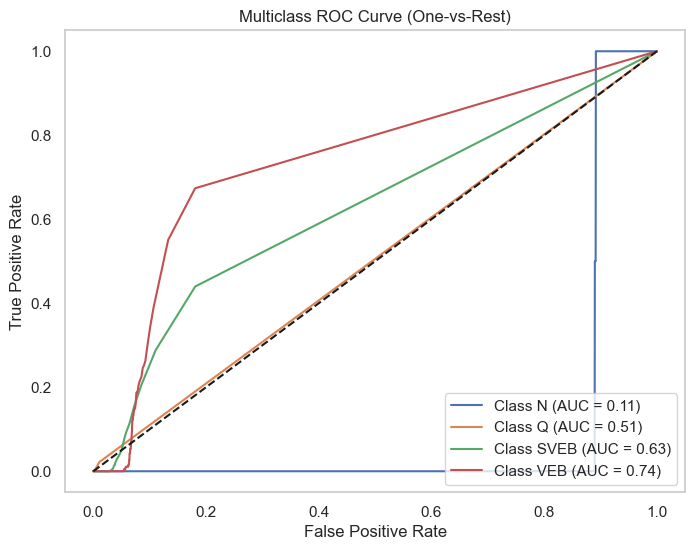

Model Accuracy = 71.5 %
Model recall = 65.3 %
Model precision = 37.0 %
Model f1_score = 37.1 %
Matthews Correlation Coefficient = 0.356
Cohen’s Kappa = 0.283
Log Loss = 2.064
Balanced Accuracy = 0.653
Hamming Loss = 0.285


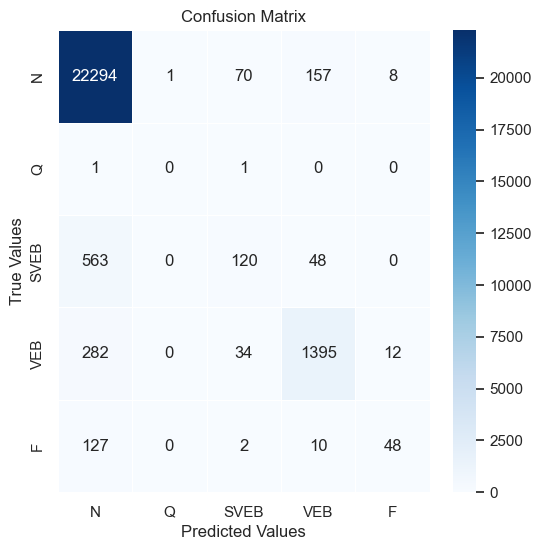

              precision    recall  f1-score   support

           0       0.97      0.71      0.82     22530
           1       0.00      0.50      0.00         2
           2       0.12      0.80      0.21       731
           3       0.69      0.71      0.70      1723
           4       0.07      0.55      0.12       187

    accuracy                           0.71     25173
   macro avg       0.37      0.65      0.37     25173
weighted avg       0.92      0.71      0.79     25173

Skipping class F due to no positive samples in y_true.


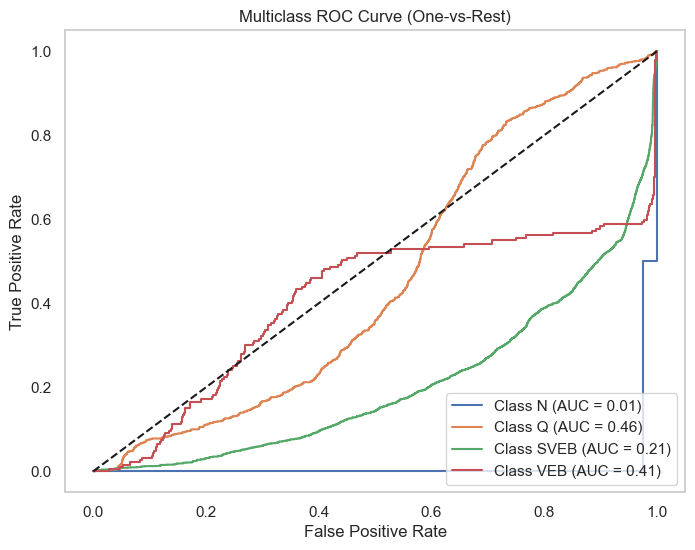

Model Accuracy = 98.1 %
Model recall = 67.8 %
Model precision = 75.7 %
Model f1_score = 71.4 %
Matthews Correlation Coefficient = 0.898
Cohen’s Kappa = 0.896
Log Loss = 0.130
Balanced Accuracy = 0.678
Hamming Loss = 0.019


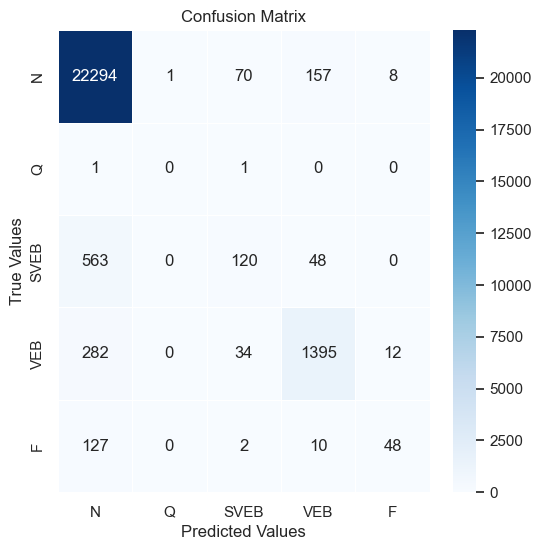

              precision    recall  f1-score   support

           0       0.98      1.00      0.99     22530
           1       0.00      0.00      0.00         2
           2       0.94      0.73      0.82       731
           3       0.97      0.90      0.93      1723
           4       0.89      0.76      0.82       187

    accuracy                           0.98     25173
   macro avg       0.76      0.68      0.71     25173
weighted avg       0.98      0.98      0.98     25173

Skipping class F due to no positive samples in y_true.


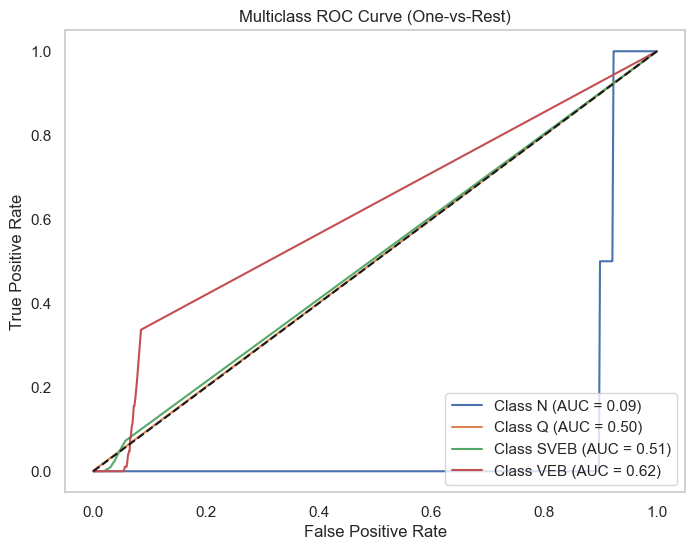

Model Accuracy = 98.7 %
Model recall = 68.8 %
Model precision = 77.2 %
Model f1_score = 72.5 %
Matthews Correlation Coefficient = 0.929
Cohen’s Kappa = 0.928
Log Loss = 0.046
Balanced Accuracy = 0.688
Hamming Loss = 0.013


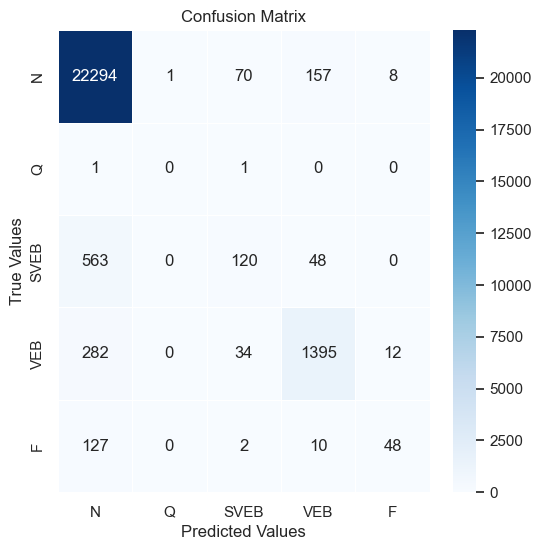

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     22530
           1       0.00      0.00      0.00         2
           2       0.96      0.75      0.84       731
           3       0.98      0.96      0.97      1723
           4       0.93      0.73      0.82       187

    accuracy                           0.99     25173
   macro avg       0.77      0.69      0.73     25173
weighted avg       0.99      0.99      0.99     25173

Skipping class F due to no positive samples in y_true.


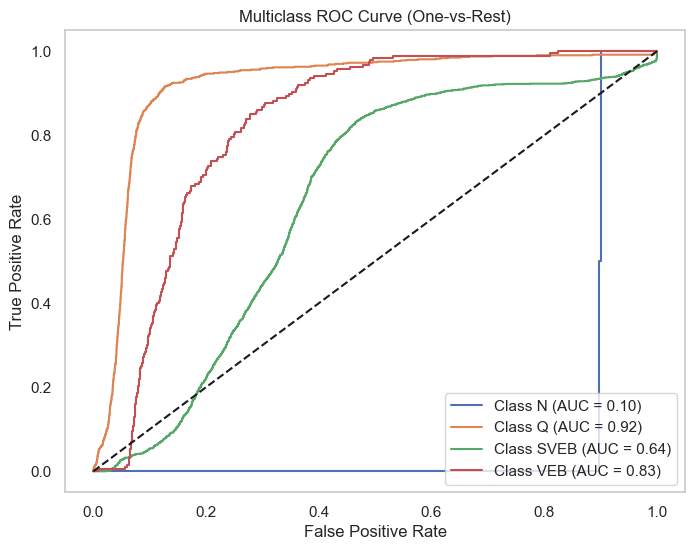

Model Accuracy = 98.8 %
Model recall = 73.0 %
Model precision = 74.4 %
Model f1_score = 73.7 %
Matthews Correlation Coefficient = 0.940
Cohen’s Kappa = 0.940
Log Loss = 0.060
Balanced Accuracy = 0.730
Hamming Loss = 0.012


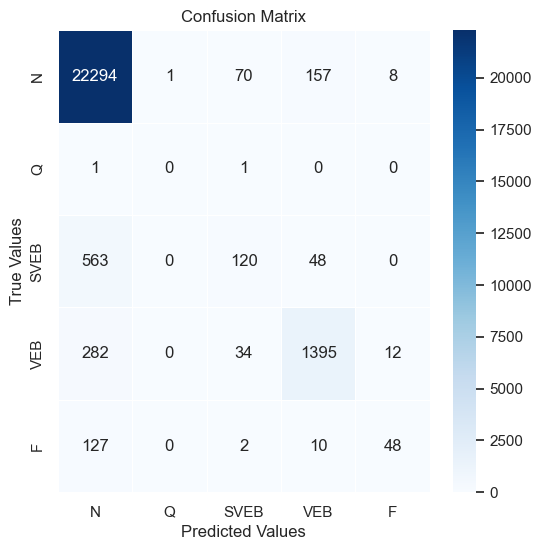

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     22530
           1       0.00      0.00      0.00         2
           2       0.91      0.88      0.90       731
           3       0.96      0.97      0.97      1723
           4       0.85      0.80      0.83       187

    accuracy                           0.99     25173
   macro avg       0.74      0.73      0.74     25173
weighted avg       0.99      0.99      0.99     25173

Skipping class F due to no positive samples in y_true.


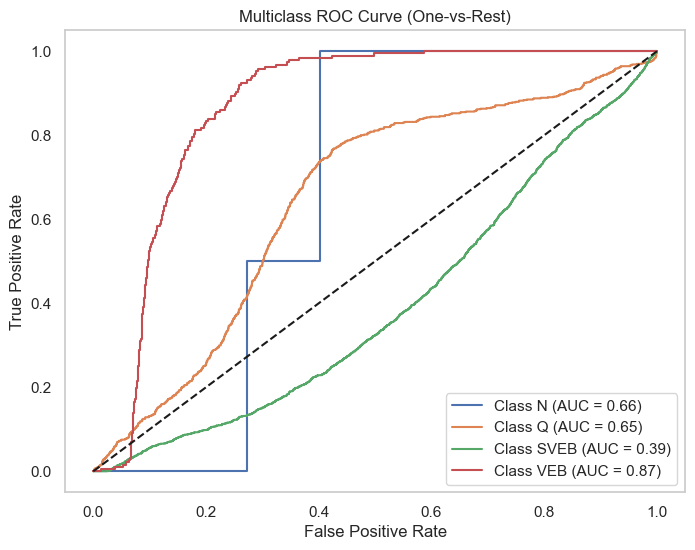

Model Comparison:
                  Model  Accuracy    recall  precision  f1 Score
2        Random Forest  0.988917  0.709237   0.778404  0.740472
6       Neural Network  0.988361  0.729940   0.743617  0.736581
5                  SVM  0.986652  0.687846   0.772425  0.725077
4                  Knn  0.981051  0.678317   0.756712  0.713638
1        Decision Tree  0.978111  0.695506   0.692505  0.693845
0  Logistic Regression  0.947722  0.444001   0.611831  0.487535
3          Naive Bayes  0.714893  0.653411   0.369651  0.371151

Prediction Comparison:
       Actual Logistic Decision Tree Random Forest Naive Bayes Knn SVM  \
0          1        1             1             1           2   1   1   
1          1        1             1             1           1   1   1   
2          1        1             1             1           1   1   1   
3          1        1             4             1           1   1   1   
4          1        1             1             1           1   1   1   
...   

In [ ]:
# List of models and predictions
# ######finalllly comparidions
model_info = [
    ("Logistic Regression", test_y_pred_log_best, best_log_reg),
    ("Decision Tree",      test_y_pred_tree_best, best_tree),
    ("Random Forest",       test_y_pred_rf_best, best_rf),
    ("Balanced Random Forest", test_y_pred_balanced_rf_best, best_balanced_rf),
    ("Naive Bayes",        test_y_pred_nb_best,best_nb),
    ("Knn",                  test_y_pred_knn_best, best_knn),
    ("SVM",                  test_y_pred_svm_best,best_svm),
    ("Neural Network",      test_pred_encoded_NN, best_NN)
]

# Evaluate all models and store results in a list
results_list = []
for model_name, prediction, model in model_info:
    acc, rec, prec, f1 = evaluation(prediction, model)
    results_list.append([model_name, acc, rec, prec, f1])

# Create DataFrame from the results list
results = pd.DataFrame(results_list, columns=["Model", "Accuracy", "recall", "precision", "f1 Score"])

# Sort results by Accuracy
results = results.sort_values(by="Accuracy", ascending=False)
print("Model Comparison:\n", results)

# Prediction comparison table
prediction_y = pd.DataFrame({
    "Actual": y_test.values,
    "Logistic": test_y_pred_log_best_labels,
    "Decision Tree":test_y_pred_tree_best_labels,
    "Random Forest": test_y_pred_rf_best_labels,
    "Balanced Random Forest": test_y_pred_balanced_rf_best_labels,
    "Naive Bayes":test_y_pred_nb_best_labels,
    "Knn": test_y_pred_knn_best_labels,
    "SVM": test_y_pred_svm_best_labels,
    "Neural Network": test_pred_labels_NN
})
print("\nPrediction Comparison:\n", prediction_y)
# Prediction comparison table
prediction_y = pd.DataFrame({
    "Actual": y_test.values,
    "Logistic":test_y_pred_log_best_labels,
    "Decision Tree":test_y_pred_tree_best_labels,
    "Random Forest": test_y_pred_rf_best_labels,
    "Balanced Random Forest": test_y_pred_balanced_rf_best_labels,
    "Naive Bayes":test_y_pred_nb_best_labels,
    "Knn": test_y_pred_knn_best_labels,
    "SVM": test_y_pred_svm_best_labels,
    "Neural Network": test_pred_labels_NN
})
print("\nPrediction Comparison:\n", prediction_y)


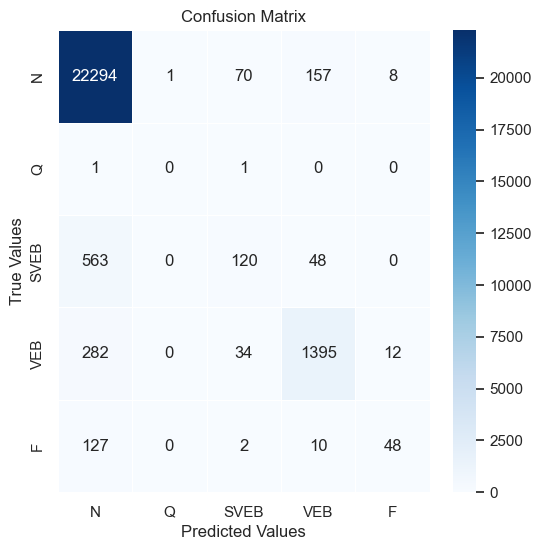

In [ ]:
# Custom function to compute confusion matrix
def compute_confusion_matrix(y_true, y_pred, label_names):
    matrix = np.zeros((len(label_names), len(label_names)), dtype=int)
    # Create a mapping from encoded values to label names
    label_to_index = {i: label for i, label in enumerate(label_names)}  # Use integer indices for encoded labels
    # Loop through true and predicted values
    for true, pred in zip(y_true, y_pred):
        # Map encoded values to labels using the integer indices
        true_label = label_to_index[true]
        pred_label = label_to_index[pred]
        matrix[true][pred] += 1
        
    return pd.DataFrame(matrix, index=label_names, columns=label_names)

# Define label names (this corresponds to the label names in the output)
label_names = ["N", "Q", "SVEB", "VEB", "F"]  # Adjust as per your dataset
# Use sorted unique values of the encoded labels
labels = np.arange(len(label_names))  # Create a list of indices corresponding to label_names

# Assuming y_test_encoded and test_pred_encoded_log are already available
# Compute the confusion matrix using the custom function
cm_df = compute_confusion_matrix(y_test_encoded,test_y_pred_log_best, label_names)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(6, 6))
ax = sns.heatmap(cm_df, annot=True, cmap="Blues", fmt="d", linewidths=0.5)
ax.set_title('Confusion Matrix')
ax.set_xlabel('Predicted Values')
ax.set_ylabel('True Values')
plt.show()
